# Can we cluster UK Local Authorities based on administrative data?

This project aims to group uk local authorities into Estimation Areas based on variables calculated from administrative data sources such as doctor's records. Here we will use churn variables as well as communal establishment percentages and average ages. We will attempt a selection of clustering techniques and assess them for successful clustering outputs

In [1]:
# general data managing packages
import pandas as pd
import numpy as np
import sys
import itertools


# data vis packages
import plotly.express as px
from plotly.offline import  plot
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.style as style

# machine learning packages
import sklearn

from sklearn.cluster import KMeans, MeanShift, estimate_bandwidth, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import scipy.cluster.hierarchy as sch
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.decomposition import PCA
from sklearn.datasets import make_blobs
from minisom import MiniSom
import tensorflow as tf

# Load in the datasets


In [2]:
datapath = r'C:\Users\reesj\Downloads\Cluster_analysis\Cluster_analysis\Data\master_file.csv'

df = pd.read_csv(datapath)

In [3]:
df.head()

,LA code21,LA name21,PDS_inchurn_pc,PDS_outchurn_pc,PDS_netchurn_pc,CE_perc,ABPEv3_netchurn_pc
0,E07000223,Adur,4.780641,4.436945,0.343696,1.2,0.252931
1,E07000026,Allerdale,2.587944,2.386432,0.201512,1.5,-0.154710
2,E07000032,Amber Valley,4.115586,3.326648,0.788938,0.9,0.872958
3,E07000224,Arun,4.423419,3.686908,0.736511,2.5,0.484574
4,E07000170,Ashfield,4.008036,3.933770,0.074266,1.1,0.368830


Adding some more features, just so we have a bit more data to work with

In [4]:
# read in age data
age_path = r"C:\Users\reesj\Downloads\Cluster_analysis\Cluster_analysis\Data\mean_median_age_LAs.csv"
ages = pd.read_csv(age_path)

# copy original data frame so we don't overwrite anything
df_orig = df.copy()

# merge and view
df_age = df_orig.merge(ages, on='LA code21')
df_age.head()

,LA code21,LA name21,PDS_inchurn_pc,PDS_outchurn_pc,PDS_netchurn_pc,CE_perc,ABPEv3_netchurn_pc,mean_age,median_age
0,E07000223,Adur,4.780641,4.436945,0.343696,1.2,0.252931,43.475187,45.0
1,E07000026,Allerdale,2.587944,2.386432,0.201512,1.5,-0.154710,44.729319,48.0
2,E07000032,Amber Valley,4.115586,3.326648,0.788938,0.9,0.872958,43.380625,46.0
3,E07000224,Arun,4.423419,3.686908,0.736511,2.5,0.484574,46.305739,49.0
4,E07000170,Ashfield,4.008036,3.933770,0.074266,1.1,0.368830,41.067098,41.0


The point in the far top right of this corner is the city of london. For some reason it's ABPE netchurn variable is far hiher than any other datapoint, so we can remove it

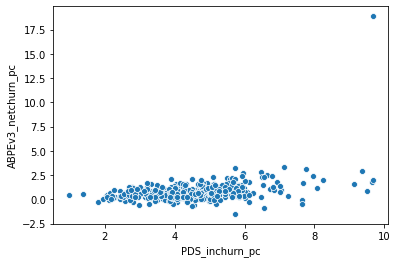

In [5]:
sns.scatterplot(data = df, x='PDS_inchurn_pc', y='ABPEv3_netchurn_pc')

In [6]:
london = df_age[df_age['LA name21']=='City of London']

df_age = df_age[df_age['LA name21']!='City of London']

df_age.shape

(330, 9)

# Select feature data and save LA labels for later use

In [7]:
'Separate our names, for later reference'

la_names = df_age['LA name21']
la_names

0              Adur
1         Allerdale
2      Amber Valley
3              Arun
4          Ashfield
           ...     
326         Wrexham
327        Wychavon
328            Wyre
329     Wyre Forest
330            York
Name: LA name21, Length: 330, dtype: object

In [8]:
# select our feature data

data = df_age.iloc[:,2:]

feature_names = list(data.columns)

data

,PDS_inchurn_pc,PDS_outchurn_pc,PDS_netchurn_pc,CE_perc,ABPEv3_netchurn_pc,mean_age,median_age
0,4.780641,4.436945,0.343696,1.2,0.252931,43.475187,45.0
1,2.587944,2.386432,0.201512,1.5,-0.154710,44.729319,48.0
2,4.115586,3.326648,0.788938,0.9,0.872958,43.380625,46.0
3,4.423419,3.686908,0.736511,2.5,0.484574,46.305739,49.0
4,4.008036,3.933770,0.074266,1.1,0.368830,41.067098,41.0
...,...,...,...,...,...,...,...
326,2.192605,2.580963,-0.388358,1.2,0.089787,41.407769,42.0
327,5.149382,4.155045,0.994337,1.2,1.453343,44.765508,48.0
328,4.359850,3.641684,0.718166,1.7,0.288346,46.129279,49.0
329,3.287558,3.212526,0.075031,1.0,0.282398,44.068288,46.0


# Normalize feature data

In [9]:
# call our previously defined functions to create newly normalised datasets

scaler = StandardScaler()

scaler.fit(data)

stand_data = scaler.transform(data)

stand_data = pd.DataFrame(stand_data, columns=feature_names)

stand_data

,PDS_inchurn_pc,PDS_outchurn_pc,PDS_netchurn_pc,CE_perc,ABPEv3_netchurn_pc,mean_age,median_age
0,0.177258,0.032787,0.306110,-0.414921,-0.781978,0.699843,0.619017
1,-1.366600,-1.332180,0.091177,-0.232274,-1.365112,1.096146,1.209978
2,-0.291001,-0.706305,0.979162,-0.597567,0.104978,0.669962,0.816004
3,-0.074259,-0.466491,0.899910,0.376546,-0.450609,1.594290,1.406965
4,-0.366726,-0.302162,-0.101175,-0.475803,-0.616183,-0.061107,-0.168931
...,...,...,...,...,...,...,...
325,-1.644955,-1.202686,-0.800503,-0.414921,-1.015355,0.046544,0.028056
326,0.436885,-0.154865,1.289654,-0.414921,0.935224,1.107581,1.209978
327,-0.119017,-0.496595,0.872180,-0.110510,-0.731315,1.538529,1.406965
328,-0.874009,-0.782273,-0.100018,-0.536685,-0.739824,0.887262,0.816004


Here I use a quick implementation of a seaborn heatmap to view correlations between columns. As we can see some of the columns are fairly closely correlated, so some dimension reduction with PCA might be a good idea. 

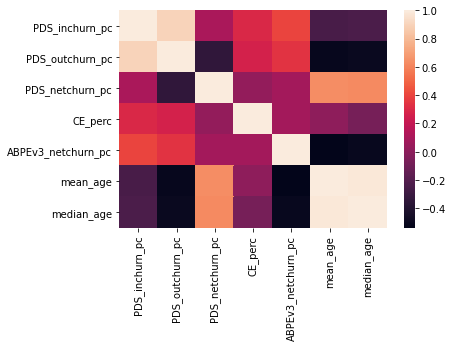

In [10]:

%matplotlib inline


# calculate the correlation matrix
corr = stand_data.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

Principle component analysis allows us to reduce the data down to the true vectors that explain our data variance. In theory this will reduce data noise, and allow our clustering algorithms to work more effectively

The following code identifies the number of principle components to account for 95% of the variance in our dataset

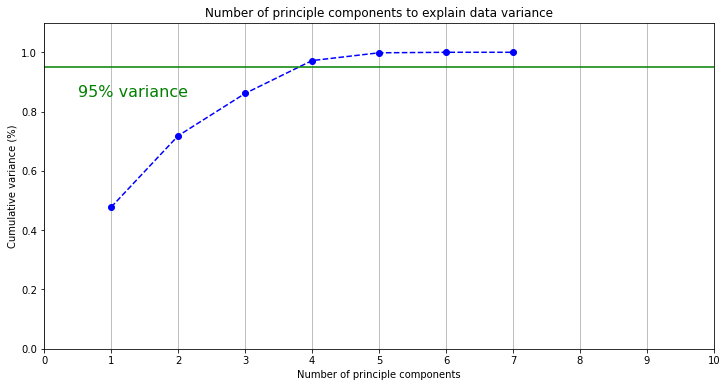

In [11]:

pca = PCA().fit(stand_data)

#% matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 8, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of principle components')
plt.xticks(np.arange(0, 11, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('Number of principle components to explain data variance')

plt.axhline(y=0.95, color='g', linestyle='-')
plt.text(0.5, 0.85, '95% variance', color = 'green', fontsize=16)

ax.grid(axis='x')
plt.show()

In [12]:
# then I can choose 4 principal components and tell the code reduce our DF to 4 columns

pca = PCA(n_components=4)

principalComponents = pca.fit_transform(stand_data)

pca_data = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4'
                         ])

In [13]:
pca_data.head()

,principal component 1,principal component 2,principal component 3,principal component 4
0,-0.974035,0.340428,0.318212,-0.771794
1,-2.680592,-0.810972,0.601195,0.113325
2,-1.463782,0.300473,-0.873444,-0.156912
3,-2.080615,1.178056,0.240204,0.055507
4,-0.371475,-0.706034,0.119654,-0.277553


## K-Means clustering

Using elbow testing to decide the optimal number of clusters

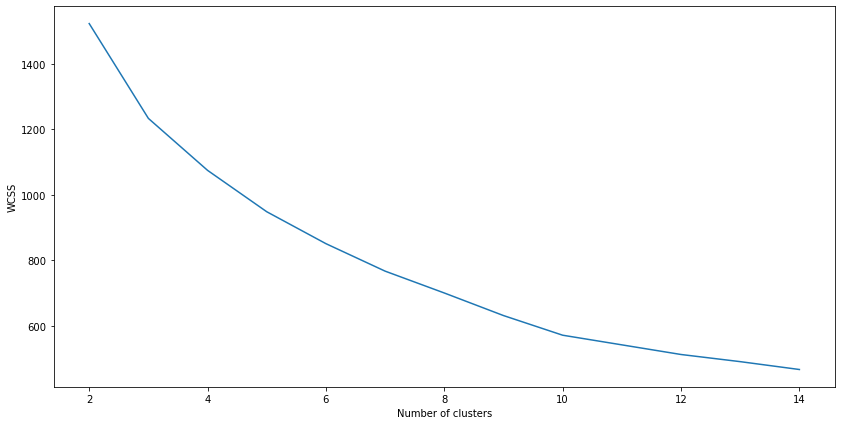

In [15]:
'''
Elbow testing in kmeans can show what the ideal number of clusters for kmeans

Here the elbow point seems to happen at around 4 clusters 
'''

def elbow_testing(data, k_range):
    wcss = [] 
    for i in k_range: 
        kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
        kmeans.fit(data) 
        wcss.append(kmeans.inertia_)
    
    fig, ax = plt.subplots(figsize=(14, 7))
    plt.plot(range(2, 15), wcss)
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS') 
    plt.show()
        

elbow_testing(pca_data, k_range=range(2, 15))



There is no particularly clear elbow in our chart, but there is definitely a kink in the line at 10 clusters. Next I will check the silhouette method and check if this is replicated there

For n_clusters = 2 The average silhouette_score is : 0.3604046274793465
For n_clusters = 3 The average silhouette_score is : 0.24361038847834351
For n_clusters = 4 The average silhouette_score is : 0.22598528333561366
For n_clusters = 5 The average silhouette_score is : 0.24191849838568227
For n_clusters = 6 The average silhouette_score is : 0.2514863404207546
For n_clusters = 7 The average silhouette_score is : 0.2456418517553333
For n_clusters = 8 The average silhouette_score is : 0.23833726827845728
For n_clusters = 9 The average silhouette_score is : 0.25930710918098665
For n_clusters = 10 The average silhouette_score is : 0.26719747331266663
For n_clusters = 11 The average silhouette_score is : 0.23997794425783545
For n_clusters = 12 The average silhouette_score is : 0.2452308447258606
For n_clusters = 13 The average silhouette_score is : 0.22783223727239144
For n_clusters = 14 The average silhouette_score is : 0.22537413945980037


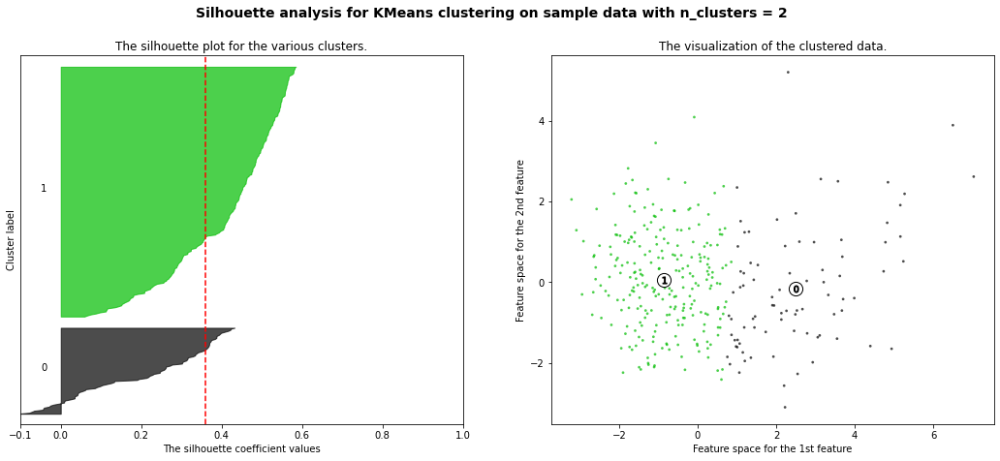

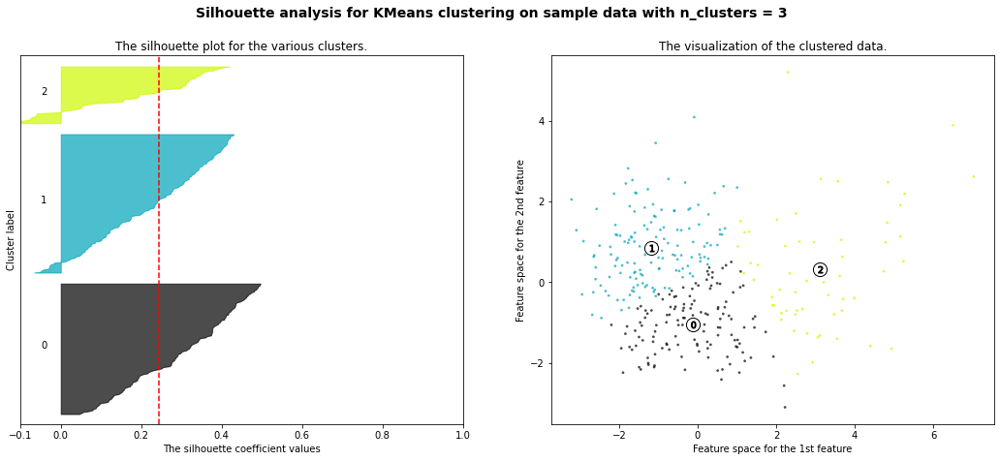

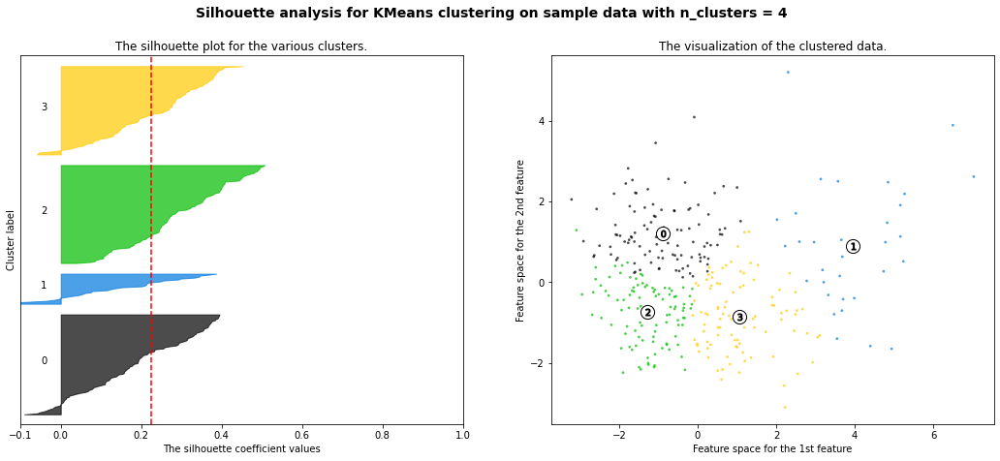

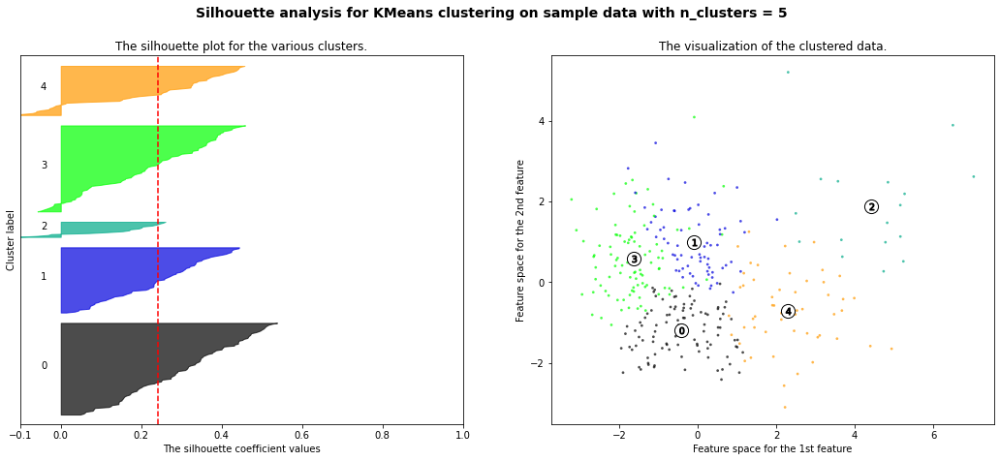

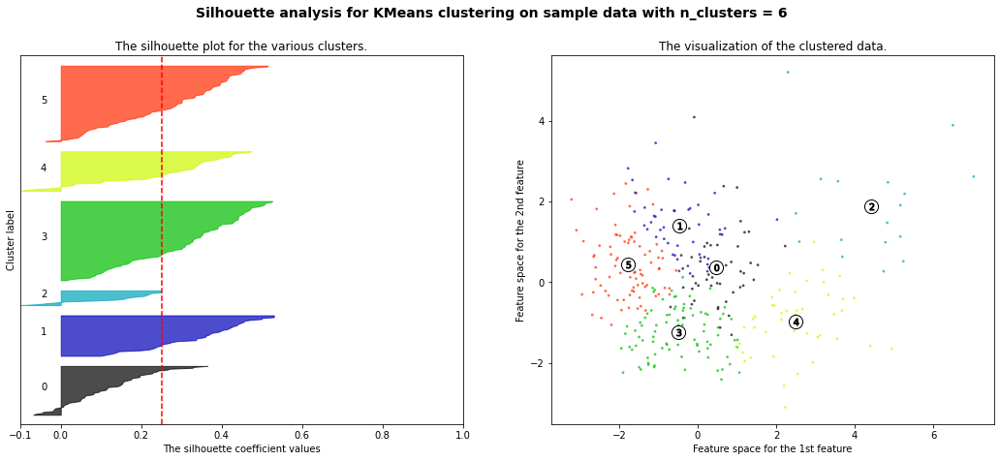

...

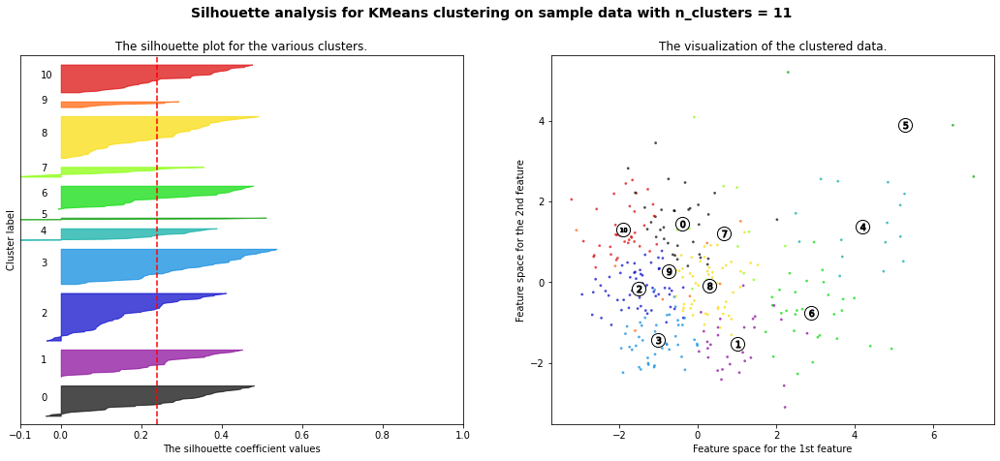

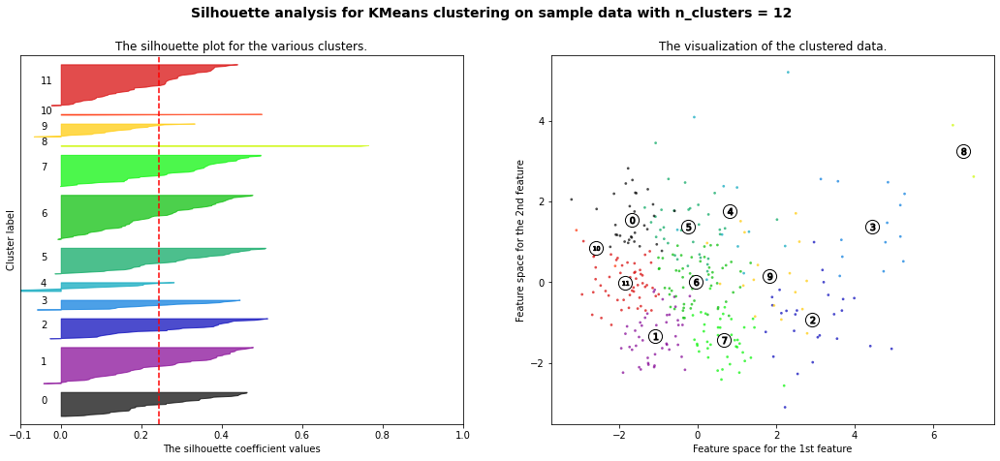

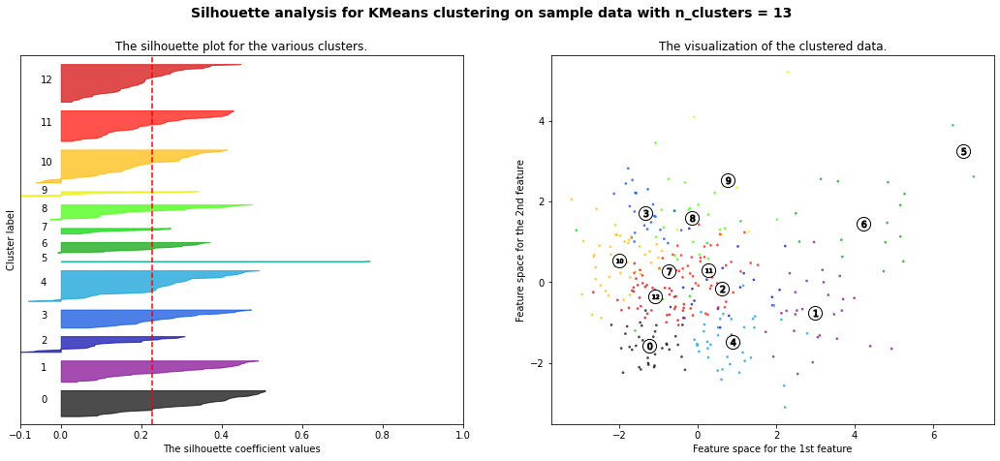

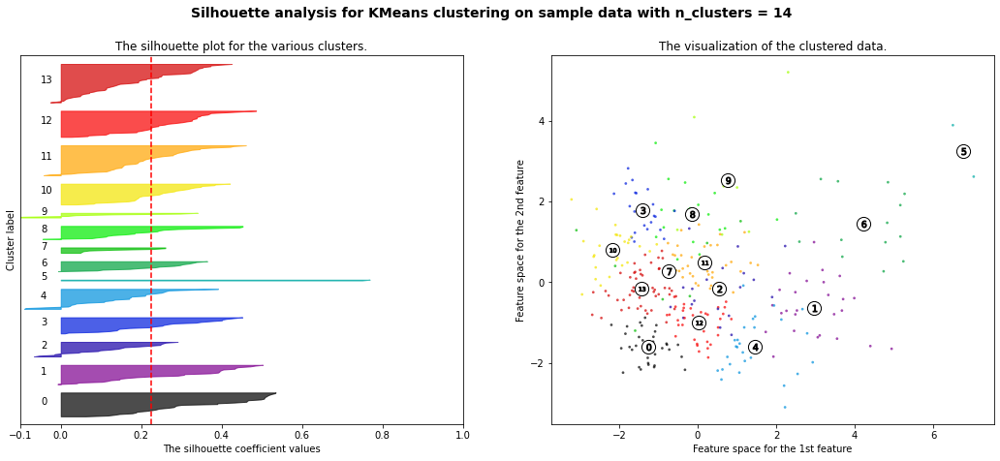

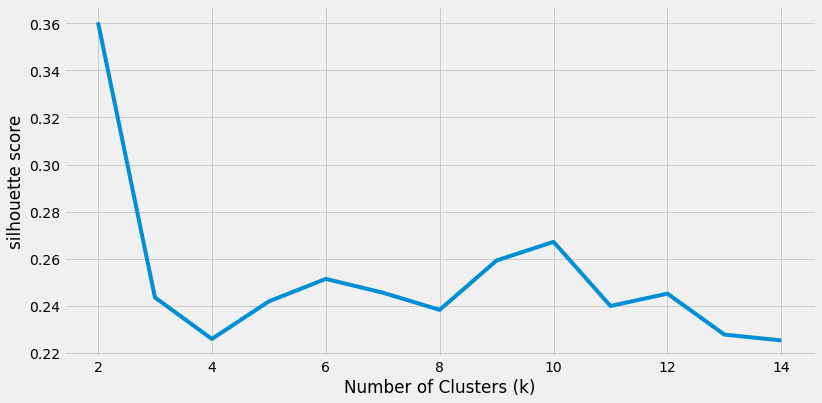

In [16]:


# here we select our zscore normalised data
X = pd.DataFrame(pca_data)

range_n_clusters = range(2,15)
silhouette_avg_n_clusters = []

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    silhouette_avg_n_clusters.append(silhouette_avg)
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

     # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X.iloc[:, 0], X.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                 c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                   s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()


style.use("fivethirtyeight")
plt.plot(range_n_clusters, silhouette_avg_n_clusters)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("silhouette score")
plt.show()

as we can see here there is also a slight peak at 10 clusters, so we will use 10 clusters to produce and output our k-means clusters

In [17]:
# bringing in the kmeans object

kmeans = KMeans(n_clusters=10, random_state=42)

In [49]:
# fitting to the data
cluster_labels = kmeans.fit_predict(pca_data)


In [19]:
# taking the cluster labels and adding them to the dataframe

kmeans_cluster_df = pca_data.copy()

kmeans_cluster_df['LA'] = la_names
kmeans_cluster_df['cluster'] = cluster_labels

kmeans_cluster_df

,principal component 1,principal component 2,principal component 3,principal component 4,LA,cluster
0,-0.974035,0.340428,0.318212,-0.771794,Adur,3
1,-2.680592,-0.810972,0.601195,0.113325,Allerdale,0
2,-1.463782,0.300473,-0.873444,-0.156912,Amber Valley,3
3,-2.080615,1.178056,0.240204,0.055507,Arun,3
4,-0.371475,-0.706034,0.119654,-0.277553,Ashfield,2
...,...,...,...,...,...,...
325,-1.257668,-2.009889,0.508029,0.344201,Worthing,0
326,-1.183083,1.484017,-1.245079,-0.317417,Wrexham,8
327,-2.222119,0.875410,0.184766,-0.371733,Wychavon,3
328,-1.748331,-0.638329,0.220288,-0.249796,Wyre,0


In [20]:
# checking the distribution of cluster points

kmeans_cluster_df['cluster'].value_counts()

0    63
3    62
2    57
4    44
8    41
1    31
6    14
9     8
7     8
5     2
Name: cluster, dtype: int64

In [21]:
# checking the silhouette metric

sklearn.metrics.silhouette_score(pca_data, cluster_labels)

0.26719747331266663

Plotting the 3d scatter plot to visualise clusters

In [22]:


fig = px.scatter_3d(kmeans_cluster_df,
                    x='principal component 1',
                    y='principal component 2',
                    z='principal component 3',
              color='cluster')
fig.show()


exporting the plot and the dataframe

In [23]:
fig.write_html(r'C:\Users\reesj\Downloads\Cluster_analysis\Cluster_analysis\Outputs\Cluster_Groupings\kmeans_clusters.html')

In [24]:

kmeans_cluster_df.to_csv(r'C:\Users\reesj\Downloads\Cluster_analysis\Cluster_analysis\Outputs\Cluster_Groupings\kmeans_clusters.csv')

## hierarchical clustering implementation



Using a Dendogram to get an idea of how our clusters best work for an optimal cluster number

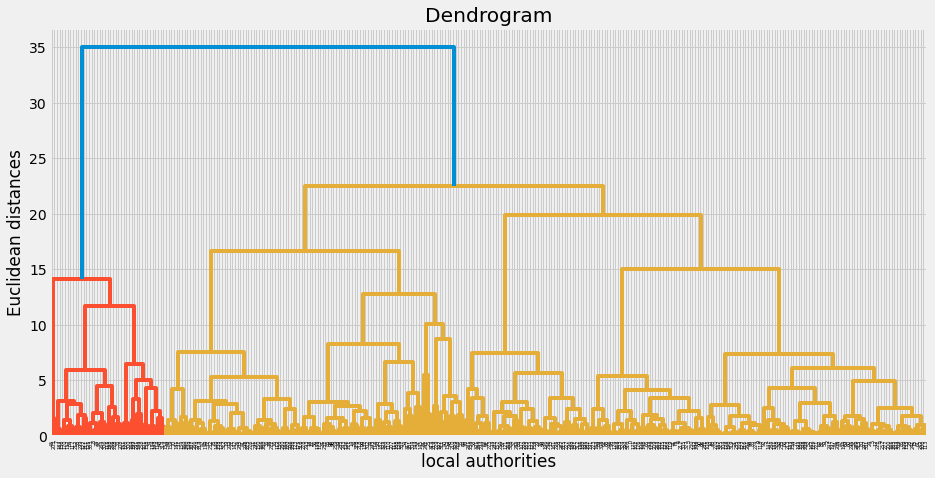

In [23]:

fig, ax = plt.subplots(figsize=(14, 7))
dendrogram = sch.dendrogram(sch.linkage(pca_data, method  = "ward"))
plt.title('Dendrogram')
plt.xlabel('local authorities')
plt.ylabel('Euclidean distances')
plt.show()

Using the silhouette method again to see if any number of clusters have a peak in the score

silhouette score for 2 clusters: 0.4041298710737868
silhouette score for 3 clusters: 0.2026856935835148
silhouette score for 4 clusters: 0.21131132078607665
silhouette score for 5 clusters: 0.21856893712604905
silhouette score for 6 clusters: 0.20818539870158181
silhouette score for 7 clusters: 0.21824499023998833
silhouette score for 8 clusters: 0.23667504014285415
silhouette score for 9 clusters: 0.2382116159028503
silhouette score for 10 clusters: 0.24521309984907816
silhouette score for 11 clusters: 0.24938512156084258
silhouette score for 12 clusters: 0.2314245990083816
silhouette score for 13 clusters: 0.2279758908117694
silhouette score for 14 clusters: 0.22907604196543466


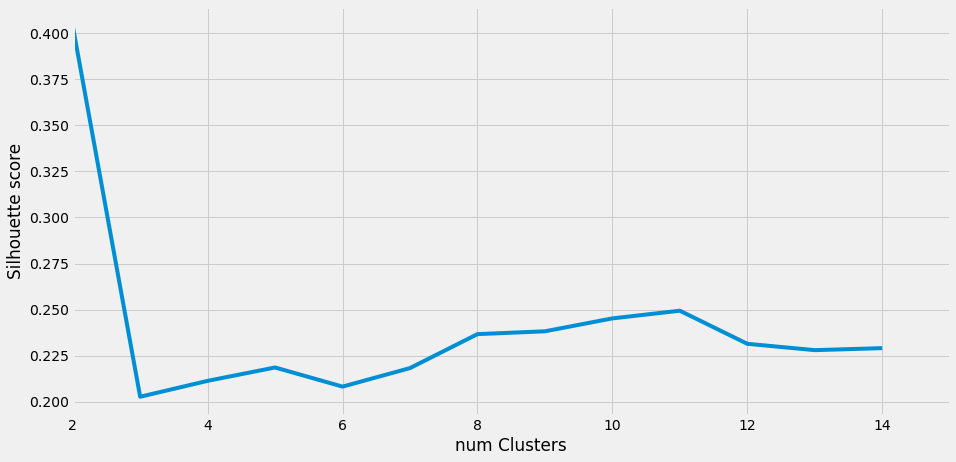

In [24]:

scores = []

for i in range(2, 15):

    hc = AgglomerativeClustering(n_clusters = i, affinity = 'euclidean', linkage ='ward')

    y_hc=hc.fit_predict(pca_data)

    score = sklearn.metrics.silhouette_score(pca_data, y_hc)
    scores.append(score)

    print("silhouette score for "+str(i)+" clusters: "+str(score))

fig, ax = plt.subplots(figsize=(14, 7))
plt.xlim(2, 15)
plt.plot(range(2, 15), scores)
plt.ylabel('Silhouette score')
plt.xlabel('num Clusters')
plt.show()

the peak appears at 11 clusters for hierarchical clustering. Now we can run hrc with 11 clusters to generate final output

In [25]:
# calling the 

hc = AgglomerativeClustering(n_clusters = 11, affinity = 'euclidean', linkage ='ward')

y_hc=hc.fit_predict(pca_data)

In [26]:
from collections import Counter
Counter(y_hc)

Counter({5: 44,
         4: 83,
         8: 25,
         1: 51,
         3: 47,
         0: 46,
         9: 4,
         2: 16,
         7: 10,
         6: 2,
         10: 2})

In [27]:
hier_cluster_df = pca_data.copy()

hier_cluster_df['hier_cluster'] = y_hc

hier_cluster_df['la_name'] = la_names

hier_cluster_df

,principal component 1,principal component 2,principal component 3,principal component 4,hier_cluster,la_name
0,-0.974035,0.340428,0.318212,-0.771794,5,Adur
1,-2.680592,-0.810972,0.601195,0.113325,4,Allerdale
2,-1.463782,0.300473,-0.873444,-0.156912,4,Amber Valley
3,-2.080615,1.178056,0.240204,0.055507,5,Arun
4,-0.371475,-0.706034,0.119654,-0.277553,4,Ashfield
...,...,...,...,...,...,...
325,-1.257668,-2.009889,0.508029,0.344201,4,Worthing
326,-1.183083,1.484017,-1.245079,-0.317417,3,Wrexham
327,-2.222119,0.875410,0.184766,-0.371733,5,Wychavon
328,-1.748331,-0.638329,0.220288,-0.249796,4,Wyre


Plotting the 3d scatter plot to visualise clusters

In [28]:
import plotly.express as px

fig = px.scatter_3d(hier_cluster_df,
                    x='principal component 1',
                    y='principal component 2',
                    z='principal component 3',
              color='hier_cluster')
fig.show()

In [32]:
fig.write_html(r'C:\Users\reesj\Downloads\Cluster_analysis\Cluster_analysis\Outputs\Cluster_Groupings\hierarchical_clusters.html')

In [33]:
hier_cluster_df.to_csv(r'C:\Users\reesj\Downloads\Cluster_analysis\Cluster_analysis\Outputs\Cluster_Groupings\hierarchical_clusters.csv')

## minisom implementation

In [29]:
scores = []

for i in range(2, 15):

    minisom_data = pca_data.copy().values

    validation_data = minisom_data.copy()
    
    # Initialization and training
    som_shape = (1, i)
    som = MiniSom(som_shape[0], som_shape[1], minisom_data.shape[1], sigma=.5, learning_rate=0.5,
                  neighborhood_function='gaussian', random_seed=10)

    som.train_batch(minisom_data, 10000, verbose=True)

    # each neuron represents a cluster
    winner_coordinates = np.array([som.winner(x) for x in minisom_data]).T
    # with np.ravel_multi_index we convert the bidimensional
    # coordinates to a monodimensional index
    cluster_index = np.ravel_multi_index(winner_coordinates, som_shape)

    score = sklearn.metrics.silhouette_score(validation_data, cluster_index)

    scores.append(score)

    print("silhouette score for "+str(i)+" clusters: "+str(score))

 [   606 / 10000 ]   6% - 0:00:02 left 

 [  1189 / 10000 ]  12% - 0:00:02 left 

 [  1692 / 10000 ]  17% - 0:00:02 left 

 [  2284 / 10000 ]  23% - 0:00:02 left 

 [  2817 / 10000 ]  28% - 0:00:02 left 

 [  3408 / 10000 ]  34% - 0:00:02 left 

 [  3943 / 10000 ]  39% - 0:00:02 left 

 [  4578 / 10000 ]  46% - 0:00:01 left 

 [  5209 / 10000 ]  52% - 0:00:01 left 

 [  5846 / 10000 ]  58% - 0:00:01 left 

 [  6452 / 10000 ]  65% - 0:00:01 left 

 [  7167 / 10000 ]  72% - 0:00:00 left 

 [  7826 / 10000 ]  78% - 0:00:00 left 

 [  8505 / 10000 ]  85% - 0:00:00 left 

 [  9093 / 10000 ]  91% - 0:00:00 left 

 [  9664 / 10000 ]  97% - 0:00:00 left 

 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.9806460284697782
silhouette score for 2 clusters: 0.2760245521231598


 [   883 / 10000 ]   9% - 0:00:02 left 

 [  1370 / 10000 ]  14% - 0:00:02 left 

 [  1994 / 10000 ]  20% - 0:00:02 left 

 [  2614 / 10000 ]  26% - 0:00:02 left 

 [  3214 / 10000 ]  32% - 0:00:02 left 

 [  3794 / 10000 ]  38% - 0:00:02 left 

 [  4436 / 10000 ]  44% - 0:00:01 left 

 [  5013 / 10000 ]  50% - 0:00:01 left 

 [  5529 / 10000 ]  55% - 0:00:01 left 

 [  6139 / 10000 ]  61% - 0:00:01 left 

 [  6796 / 10000 ]  68% - 0:00:01 left 

 [  7562 / 10000 ]  76% - 0:00:00 left 

 [  8330 / 10000 ]  83% - 0:00:00 left 

 [  8932 / 10000 ]  89% - 0:00:00 left 

 [  9568 / 10000 ]  96% - 0:00:00 left 

 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.8383679783062834
silhouette score for 3 clusters: 0.18809880867291423


 [   614 / 10000 ]   6% - 0:00:03 left 

 [  1205 / 10000 ]  12% - 0:00:03 left 

 [  1819 / 10000 ]  18% - 0:00:02 left 

 [  2428 / 10000 ]  24% - 0:00:02 left 

 [  2936 / 10000 ]  29% - 0:00:02 left 

 [  3515 / 10000 ]  35% - 0:00:02 left 

 [  4239 / 10000 ]  42% - 0:00:01 left 

 [  4932 / 10000 ]  49% - 0:00:01 left 

 [  5594 / 10000 ]  56% - 0:00:01 left 

 [  6213 / 10000 ]  62% - 0:00:01 left 

 [  6910 / 10000 ]  69% - 0:00:00 left 

 [  7578 / 10000 ]  76% - 0:00:00 left 

 [  8228 / 10000 ]  82% - 0:00:00 left 

 [  8887 / 10000 ]  89% - 0:00:00 left 

 [  9425 / 10000 ]  94% - 0:00:00 left 

 [  9990 / 10000 ] 100% - 0:00:00 left 

 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.7403863815765868
silhouette score for 4 clusters: 0.19946374024962235
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.5956425134173573
silhouette score for 5 clusters: 0.2367611875412166
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.5063515533315317
silhouette score for 6 clusters: 0.22950608108409185
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.4144231930475468
silhouette score for 7 clusters: 0.23441841123700574
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.3680456688870164
silhouette score for 8 clusters: 0.2453293787193913
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.3428460601676302
silhouette score for 9 clusters: 0.2403516265265725
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.2794286064843168
silhouette score for 10 clusters: 0.21611235319364444
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.23783823

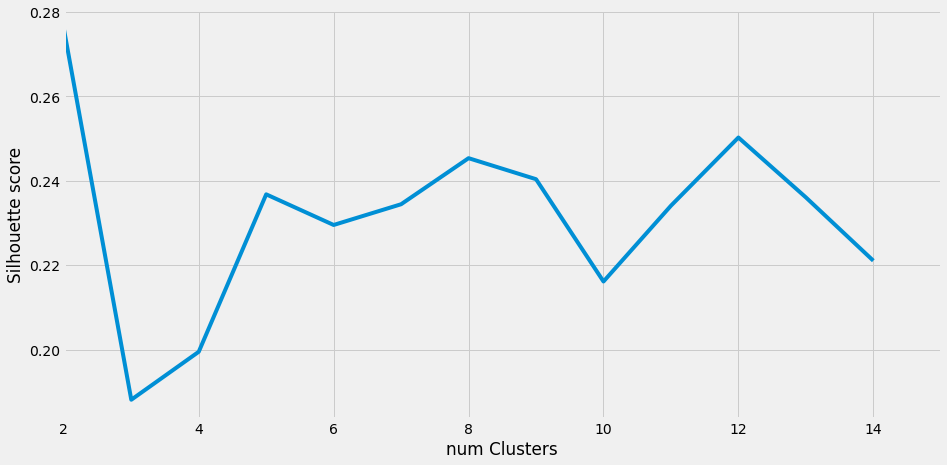

In [30]:
fig, ax = plt.subplots(figsize=(14, 7))
plt.xlim(2, 15)
plt.plot(range(2, 15), scores)
plt.ylabel('Silhouette score')
plt.xlabel('num Clusters')
plt.show()

In [31]:
# generating final cluster values

minisom_data = pca_data.copy().values

validation_data = minisom_data.copy()


# Initialization and training
som_shape = (1, 12)
som = MiniSom(som_shape[0], som_shape[1], minisom_data.shape[1], sigma=.5, learning_rate=.5,
              neighborhood_function='gaussian', random_seed=10)

som.train_batch(minisom_data, 10000, verbose=True)

# each neuron represents a cluster
winner_coordinates = np.array([som.winner(x) for x in minisom_data]).T
# with np.ravel_multi_index we convert the bidimensional
# coordinates to a monodimensional index
cluster_index = np.ravel_multi_index(winner_coordinates, som_shape)

print('silhouette_Score: '+str(sklearn.metrics.silhouette_score(validation_data, cluster_index)))

 [   514 / 10000 ]   5% - 0:00:03 left 

 [  1046 / 10000 ]  10% - 0:00:03 left 

 [  1618 / 10000 ]  16% - 0:00:02 left 

 [  2212 / 10000 ]  22% - 0:00:02 left 

 [  2784 / 10000 ]  28% - 0:00:02 left 

 [  3381 / 10000 ]  34% - 0:00:02 left 

 [  4000 / 10000 ]  40% - 0:00:01 left 

 [  4521 / 10000 ]  45% - 0:00:01 left 

 [  5305 / 10000 ]  53% - 0:00:01 left 

 [  5900 / 10000 ]  59% - 0:00:01 left 

 [  6511 / 10000 ]  65% - 0:00:01 left 

 [  7250 / 10000 ]  72% - 0:00:00 left 

 [  7910 / 10000 ]  79% - 0:00:00 left 

 [  8507 / 10000 ]  85% - 0:00:00 left 

 [  9264 / 10000 ]  93% - 0:00:00 left 

 [  9975 / 10000 ] 100% - 0:00:00 left 

 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.1909464612993563
silhouette_Score: 0.25022124109419214


In [32]:
from collections import Counter
Counter(cluster_index)

Counter({4: 57,
         5: 62,
         1: 56,
         9: 29,
         8: 40,
         3: 25,
         6: 12,
         0: 4,
         7: 15,
         10: 13,
         11: 3,
         2: 14})

Need to replace this with a plotly plot. Make sure to keep the centroids in there 

In [33]:
minisom_df = pca_data.copy()

minisom_df['LA'] = la_names
minisom_df['cluster'] = cluster_index

minisom_df

,principal component 1,principal component 2,principal component 3,principal component 4,LA,cluster
0,-0.974035,0.340428,0.318212,-0.771794,Adur,4
1,-2.680592,-0.810972,0.601195,0.113325,Allerdale,5
2,-1.463782,0.300473,-0.873444,-0.156912,Amber Valley,4
3,-2.080615,1.178056,0.240204,0.055507,Arun,4
4,-0.371475,-0.706034,0.119654,-0.277553,Ashfield,1
...,...,...,...,...,...,...
325,-1.257668,-2.009889,0.508029,0.344201,Worthing,5
326,-1.183083,1.484017,-1.245079,-0.317417,Wrexham,3
327,-2.222119,0.875410,0.184766,-0.371733,Wychavon,4
328,-1.748331,-0.638329,0.220288,-0.249796,Wyre,5


Plotting the 3d scatter plot to visualise clusters

In [34]:
import plotly.express as px


fig = px.scatter_3d(minisom_df,
                    x='principal component 1',
                    y='principal component 2',
                    z='principal component 3',
              color='cluster')
fig.show()

In [536]:
fig.write_html(r'C:\Users\reesj\Downloads\Cluster_analysis\Cluster_analysis\Outputs\Cluster_Groupings\minisom_clusters.html')

In [683]:
minisom_df.to_csv(r'C:\Users\reesj\Downloads\Cluster_analysis\Cluster_analysis\Outputs\Cluster_Groupings\minisom_clusters.csv')

# Tensorflow implementation



Using the Tensorflow k-means estimator feature to generate cluster outputs.

In [47]:


scores = []

for num in range(2, 15):
    tf_data = pca_data.copy()
    validation_data = tf_data.copy()

    num_points = tf_data.shape[0]
    dimensions = tf_data.shape[1]
    points = np.array(tf_data)
    #np.random.uniform(0, 1000, [num_points, dimensions])

    def input_fn():
        return tf.compat.v1.train.limit_epochs(tf.convert_to_tensor(points, dtype=tf.float32), num_epochs=1)

    num_clusters = num
    kmeans = tf.compat.v1.estimator.experimental.KMeans(
        num_clusters=num_clusters, use_mini_batch=False, seed=42)

    # train
    num_iterations = 50
    previous_centers = None
    for _ in range(num_iterations):
        kmeans.train(input_fn)
        cluster_centers = kmeans.cluster_centers()
        if previous_centers is not None:
            print('delta:', cluster_centers - previous_centers)
        previous_centers = cluster_centers
        print('score:', kmeans.score(input_fn))
    print('cluster centers:', cluster_centers)

    # map the input points to their clusters
    cluster_indices = list(kmeans.predict_cluster_index(input_fn))
    for i, point in enumerate(points):
        cluster_index = cluster_indices[i]
        center = cluster_centers[cluster_index]
        print('point:', point, 'is in cluster', cluster_index, 'centered at', center)
        
    score = sklearn.metrics.silhouette_score(validation_data, cluster_indices)
    scores.append(score)


INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\reesj\\AppData\\Local\\Temp\\tmpa8u1iw18', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_checkpoint_save_graph_def': True, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
Instructions for updating:
Use Variable.read_v

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 7...
INFO:tensorflow:Loss for final step: 1525.6661.
delta: [[ 0.04134083 -0.02427498 -0.0545806   0.03507218]
 [ 0.01103282  0.00748124  0.02453943 -0.01411489]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:12:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-7
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08800s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:12:37
INFO:tensorflow:Saving dict for global step 7: global_step = 7, loss = 1524.8289, score = 1524.8289
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7: C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-7
score: 1524.8289
INFO:tensorflow:Calling model_fn.
INF

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-15
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 15...
INFO:tensorflow:Saving checkpoints for 15 into C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 15...
INFO:tensorflow:loss = 1524.8289, step = 15
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 17...
INFO:tensorflow:Saving checkpoints for 17 into C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 17...
INFO:tensorflow:Loss for final step: 1524.8289.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Sta

INFO:tensorflow:Finished evaluation at 2022-04-26-15:12:42
INFO:tensorflow:Saving dict for global step 25: global_step = 25, loss = 1524.8289, score = 1524.8289
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25: C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-25
score: 1524.8289
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-25
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 25...
INFO:tensorflow:Saving checkpoints for 25 into C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 25...
INFO:tensorflow:loss = 1524.8289, step = 26
INFO:tensorflow:Calling checkpoint listeners before sa

INFO:tensorflow:Starting evaluation at 2022-04-26T15:12:45
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-35
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08546s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:12:45
INFO:tensorflow:Saving dict for global step 35: global_step = 35, loss = 1524.8289, score = 1524.8289
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35: C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-35
score: 1524.8289
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-35
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op

INFO:tensorflow:Saving checkpoints for 45 into C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 45...
INFO:tensorflow:Loss for final step: 1524.8289.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:12:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-45
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08123s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:12:48
INFO:tensorflow:Saving dict for global step 45: global_step = 45, loss = 1524.8289, score = 1524.8289
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45: C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-45
score: 1524.828

INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 53...
INFO:tensorflow:Saving checkpoints for 53 into C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 53...
INFO:tensorflow:loss = 1524.8289, step = 54
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 55...
INFO:tensorflow:Saving checkpoints for 55 into C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 55...
INFO:tensorflow:Loss for final step: 1524.8289.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:12:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-55
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO

score: 1524.8289
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-63
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 63...
INFO:tensorflow:Saving checkpoints for 63 into C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 63...
INFO:tensorflow:loss = 1524.8289, step = 64
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 65...
INFO:tensorflow:Saving checkpoints for 65 into C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 65...
INFO:tensorflow:Loss for final step: 1524.8289.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]]
IN

INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08309s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:12:56
INFO:tensorflow:Saving dict for global step 73: global_step = 73, loss = 1524.8289, score = 1524.8289
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 73: C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-73
score: 1524.8289
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-73
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 73...
INFO:tensorflow:Saving checkpoints for 73 into C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 73...
INFO:tensorflow:loss = 

delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:12:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-83
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08954s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:13:00
INFO:tensorflow:Saving dict for global step 83: global_step = 83, loss = 1524.8289, score = 1524.8289
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 83: C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-83
score: 1524.8289
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\T

INFO:tensorflow:loss = 1524.8289, step = 92
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 93...
INFO:tensorflow:Saving checkpoints for 93 into C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 93...
INFO:tensorflow:Loss for final step: 1524.8289.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:13:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpa8u1iw18\model.ckpt-93
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08446s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:13:02
INFO:tensorflow:Saving dict for global step 93: global_step = 93, loss = 1524.8289, score = 1524.8289
INFO:tensorflow:Saving '

point: [-0.3459613  -0.54749189 -0.252059    0.12689945] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [-1.5884673  -1.20464824  0.82378195  2.88748262] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [ 1.08397149 -0.12708427  0.69328835 -0.15114295] is in cluster 0 centered at [ 2.3413048  -0.19679298  0.20885167  0.00533467]
point: [ 0.60637397 -2.41680994 -0.24611913  0.9115182 ] is in cluster 0 centered at [ 2.3413048  -0.19679298  0.20885167  0.00533467]
point: [-0.6586464  -0.2143801  -0.03128587 -0.39795523] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [-1.27842206  1.31274887 -0.63605493  0.18960756] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [ 3.54796476 -1.40297214  0.93130528 -1.35012231] is in cluster 0 centered at [ 2.3413048  -0.19679298  0.20885167  0.00533467]
point: [-0.12068487  0.14538609  0.09934473 -0.73904185

point: [-0.32095544 -2.17533041  0.38987826  0.44635804] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [ 0.20442727 -0.78053643 -0.84211236 -0.09979357] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [ 5.1574083   1.90987703 -0.32525199 -2.24236949] is in cluster 0 centered at [ 2.3413048  -0.19679298  0.20885167  0.00533467]
point: [1.09488202 1.51199075 0.24239597 2.59076488] is in cluster 0 centered at [ 2.3413048  -0.19679298  0.20885167  0.00533467]
point: [ 1.46299197 -0.8521117  -0.41464308  1.14561197] is in cluster 0 centered at [ 2.3413048  -0.19679298  0.20885167  0.00533467]
point: [ 2.92886605 -1.98944646  0.35420995  0.85051272] is in cluster 0 centered at [ 2.3413048  -0.19679298  0.20885167  0.00533467]
point: [-1.60510841  1.75101631 -0.65933444 -0.37548911] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [ 3.20768370e+00 -1.34583958e-03  2.07029742e-01 -1.

point: [ 0.37373617  0.11486252 -0.29906016 -0.77469398] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [ 0.25711807 -0.8072605  -0.15532936 -1.03878529] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [-1.13180082 -1.47885025 -0.06113194  0.11252392] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [-0.8613224   1.35773801 -1.33269726  0.78999871] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [-2.26318932 -0.33319758  0.73369618 -0.4291325 ] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [ 1.0694378  -1.52477816  0.0310382  -0.89199126] is in cluster 0 centered at [ 2.3413048  -0.19679298  0.20885167  0.00533467]
point: [-0.48664614 -1.06492814 -0.03448124 -0.21544168] is in cluster 1 centered at [-0.9187395   0.07722254 -0.08195446 -0.00209334]
point: [-0.38399182 -1.06230314  0.20205948  0.48730629

INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\reesj\\AppData\\Local\\Temp\\tmplo00w670', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_checkpoint_save_graph_def': True, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 7...
INFO:tensorflow:Saving checkpoints for 7 into C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 7...
INFO:tensorflow:loss = 1295.908, step = 8
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 9...
INFO:tensorflow:Saving checkpoints for 9 into C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 9...
INFO:tensorflow:Loss for final step: 1295.908.
delta: [[-0.1294936   0.06288248 -0.07887416  0.07293531]
 [-0.03649497  0.07315402  0.02261636 -0.00918361]
 [ 0.24400449 -0.02709931 -0.00610058 -0.05409764]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:13:08
INFO:tensorflow:Graph was fin

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:13:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-17
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08301s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:13:10
INFO:tensorflow:Saving dict for global step 17: global_step = 17, loss = 1249.071, score = 1249.071
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17: C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-17
score: 1249.071
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-17
INFO:tensorflow:Running local_init_op.
INFO:t

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-25
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 25...
INFO:tensorflow:Saving checkpoints for 25 into C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 25...
INFO:tensorflow:loss = 1235.8644, step = 26
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 27...
INFO:tensorflow:Saving checkpoints for 27 into C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 27...
INFO:tensorflow:Loss for final step: 1235.8644.
delta: [[-0.04912328 -0.00818729 -0.00073869 -0.00016345]
 [ 0.00221324  0.02861303 -0.01006377 -0.00019342]
 [-0.06870389 -0.001221    0.01886997 -0.00525655]]
INFO:tensorfl

INFO:tensorflow:Starting evaluation at 2022-04-26T15:13:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-35
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.09159s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:13:16
INFO:tensorflow:Saving dict for global step 35: global_step = 35, loss = 1233.4294, score = 1233.4294
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35: C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-35
score: 1233.4294
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-35
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op

INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 45...
INFO:tensorflow:Saving checkpoints for 45 into C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 45...
INFO:tensorflow:Loss for final step: 1233.4294.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:13:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-45
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08450s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:13:18
INFO:tensorflow:Saving dict for global step 45: global_step = 45, loss = 1233.4294, score = 1233.4294
INFO:tensorflow:Saving 'checkpoint_path' summary for 

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 53...
INFO:tensorflow:Saving checkpoints for 53 into C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 53...
INFO:tensorflow:loss = 1233.4294, step = 53
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 55...
INFO:tensorflow:Saving checkpoints for 55 into C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 55...
INFO:tensorflow:Loss for final step: 1233.4294.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:13:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmplo00w670\mod

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 63: C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-63
score: 1233.4294
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-63
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 63...
INFO:tensorflow:Saving checkpoints for 63 into C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 63...
INFO:tensorflow:loss = 1233.4294, step = 63
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 65...
INFO:tensorflow:Saving checkpoints for 65 into C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt.
INFO:tensorflow:Calling checkpoint

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-73
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08716s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:13:27
INFO:tensorflow:Saving dict for global step 73: global_step = 73, loss = 1233.4294, score = 1233.4294
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 73: C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-73
score: 1233.4294
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-73
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before savin

INFO:tensorflow:Saving checkpoints for 83 into C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 83...
INFO:tensorflow:Loss for final step: 1233.4294.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:13:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-83
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08075s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:13:30
INFO:tensorflow:Saving dict for global step 83: global_step = 83, loss = 1233.4294, score = 1233.4294
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 83: C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt-83


INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 91...
INFO:tensorflow:Saving checkpoints for 91 into C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 91...
INFO:tensorflow:loss = 1233.4294, step = 92
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 93...
INFO:tensorflow:Saving checkpoints for 93 into C:\Users\reesj\AppData\Local\Temp\tmplo00w670\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 93...
INFO:tensorflow:Loss for final step: 1233.4294.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:13:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmplo00w670\mod

point: [-1.12396837 -1.35656396 -0.69338738  0.37217291] is in cluster 0 centered at [-0.12026146 -1.0422037  -0.00356354  0.077185  ]
point: [-1.89667931 -2.24541084  0.91195522  0.14000008] is in cluster 0 centered at [-0.12026146 -1.0422037  -0.00356354  0.077185  ]
point: [ 0.52075142 -1.124464   -0.3840365  -0.2735608 ] is in cluster 0 centered at [-0.12026146 -1.0422037  -0.00356354  0.077185  ]
point: [-0.12035283 -0.82271252 -0.53825189 -0.07973363] is in cluster 0 centered at [-0.12026146 -1.0422037  -0.00356354  0.077185  ]
point: [-1.05423911  1.12017346 -1.34674833  1.02339595] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [ 1.02444935  0.88577476  1.06676863 -0.07945775] is in cluster 2 centered at [3.1004279  0.32832468 0.22122817 0.02757384]
point: [ 0.31956073 -0.15939679 -1.00469557  0.69556392] is in cluster 0 centered at [-0.12026146 -1.0422037  -0.00356354  0.077185  ]
point: [ 0.85839597 -0.91706815 -0.35968898 -0.51573332] is

point: [ 1.01744669 -1.43418707 -0.58404672  0.08695304] is in cluster 0 centered at [-0.12026146 -1.0422037  -0.00356354  0.077185  ]
point: [-1.1825433   0.4828666   0.88430352 -0.86869704] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [-1.91983149  0.41375026  0.54868259 -0.34214701] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [-1.49052827 -1.36199994 -0.16115759  0.16690726] is in cluster 0 centered at [-0.12026146 -1.0422037  -0.00356354  0.077185  ]
point: [-2.59247766  0.36428456  0.92229242 -0.52910413] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [-0.75338571  0.96680664 -0.78079953  0.21274394] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [ 2.66695694 -0.66971016  0.11539177  0.94637145] is in cluster 2 centered at [3.1004279  0.32832468 0.22122817 0.02757384]
point: [-0.13550794 -0.16653693  1.67627811  0.23902463] is

point: [-2.49501882  0.90353361  0.97924559  0.16906729] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [-0.91925229  1.79405658 -1.69361561 -0.06509408] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [ 0.03348913  1.42859014 -0.57413806 -0.19337234] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [-1.17355364 -0.70205875  0.05484877 -0.36253549] is in cluster 0 centered at [-0.12026146 -1.0422037  -0.00356354  0.077185  ]
point: [-1.3363431   0.6782057   0.22325414 -0.11624966] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [-1.06744462  3.45231045 -2.86485325  0.18279323] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [-1.73097279 -1.60952552 -0.25657481  0.46671977] is in cluster 0 centered at [-0.12026146 -1.0422037  -0.00356354  0.077185  ]
point: [ 2.45520628 -1.20938368  1.82912492  0.4409437 

point: [-1.18308303  1.4840172  -1.24507858 -0.3174167 ] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [-2.22211861  0.87541001  0.18476594 -0.3717325 ] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [-1.74833083 -0.63832881  0.2202875  -0.24979625] is in cluster 1 centered at [-1.1786335   0.86021787 -0.08890132 -0.08535893]
point: [1.42888804 0.05728553 1.22881041 0.59249775] is in cluster 2 centered at [3.1004279  0.32832468 0.22122817 0.02757384]
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\reesj\\AppData\\Local\\Temp\\tmpw6_r5owy', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_ste

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08312s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:13:37
INFO:tensorflow:Saving dict for global step 7: global_step = 7, loss = 1138.5139, score = 1138.5139
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7: C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-7
score: 1138.5139
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-7
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 7...
INFO:tensorflow:Saving checkpoints for 7 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow:Callin

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 15...
INFO:tensorflow:Saving checkpoints for 15 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 15...
INFO:tensorflow:loss = 1098.2234, step = 15
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 17...
INFO:tensorflow:Saving checkpoints for 17 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 17...
INFO:tensorflow:Loss for final step: 1098.2234.
delta: [[-0.0579679  -0.04389101 -0.10614309  0.07414588]
 [ 0.02188754  0.0363183   0.01665144 -0.02745177]
 [-0.01156521 -0.05796903  0.06403847 -0.02064309]
 [-0.08329976  0.01098561  0.02772139 -0.00949396]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting eva

INFO:tensorflow:Loss for final step: 1085.3815.
delta: [[-0.03491223 -0.01066417 -0.04446244  0.02071521]
 [ 0.04379725  0.04036927 -0.01041424  0.00407419]
 [ 0.          0.          0.          0.        ]
 [-0.09006327  0.03466654  0.03131812 -0.0264394 ]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:13:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-25
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08285s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:13:43
INFO:tensorflow:Saving dict for global step 25: global_step = 25, loss = 1082.1271, score = 1082.1271
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25: C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-25
score: 1082.1271
INFO

INFO:tensorflow:Inference Time : 0.08794s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:13:45
INFO:tensorflow:Saving dict for global step 33: global_step = 33, loss = 1077.5472, score = 1077.5472
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33: C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-33
score: 1077.5472
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-33
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 33...
INFO:tensorflow:Saving checkpoints for 33 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 33...
INFO:tensorflow:loss = 1077.5472, step = 33
INFO:tensorf

INFO:tensorflow:Saving checkpoints for 41 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 41...
INFO:tensorflow:loss = 1075.5697, step = 42
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 43...
INFO:tensorflow:Saving checkpoints for 43 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 43...
INFO:tensorflow:Loss for final step: 1075.5697.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:13:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-43
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:I

score: 1075.5697
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-51
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 51...
INFO:tensorflow:Saving checkpoints for 51 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 51...
INFO:tensorflow:loss = 1075.5697, step = 52
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 53...
INFO:tensorflow:Saving checkpoints for 53 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 53...
INFO:tensorflow:Loss for final step: 1075.5697.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.09849s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:13:53
INFO:tensorflow:Saving dict for global step 61: global_step = 61, loss = 1075.5697, score = 1075.5697
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 61: C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-61
score: 1075.5697
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-61
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 61...
INFO:tensorflow:Saving checkpoints for 61 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 71...
INFO:tensorflow:Loss for final step: 1075.5697.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:13:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-71
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08430s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:13:57
INFO:tensorflow:Saving dict for global step 71: global_step = 71, loss = 1075.5697, score = 1075.5697
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 71: C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-71
score: 1075.5697
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 79...
INFO:tensorflow:Saving checkpoints for 79 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 79...
INFO:tensorflow:loss = 1075.5697, step = 80
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 81...
INFO:tensorflow:Saving checkpoints for 81 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 81...
INFO:tensorflow:Loss for final step: 1075.5697.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:13:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-81
INFO:tensorfl

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 89: C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-89
score: 1075.5697
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-89
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 89...
INFO:tensorflow:Saving checkpoints for 89 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 89...
INFO:tensorflow:loss = 1075.5697, step = 89
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 91...
INFO:tensorflow:Saving checkpoints for 91 into C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt.
INFO:tensorflow:Calling checkpoint

INFO:tensorflow:Starting evaluation at 2022-04-26T15:14:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-99
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.10178s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:14:05
INFO:tensorflow:Saving dict for global step 99: global_step = 99, loss = 1075.5697, score = 1075.5697
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 99: C:\Users\reesj\AppData\Local\Temp\tmpw6_r5owy\model.ckpt-99
score: 1075.5697
cluster centers: [[ 1.1379002  -0.8361801   0.05573025  0.03928271]
 [-0.9172675   1.1538794  -0.24041033 -0.17775624]
 [ 3.9367154   0.89849454  0.01889309 -0.05124693]
 [-1.245542   -0.7822249   0.2005439   0.17039892]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:

point: [ 0.57170328  1.18831745 -0.81520569  0.32100518] is in cluster 1 centered at [-0.9172675   1.1538794  -0.24041033 -0.17775624]
point: [-1.26847088 -1.87934681 -0.09689882  0.59787782] is in cluster 3 centered at [-1.245542   -0.7822249   0.2005439   0.17039892]
point: [-1.85646616  1.0043602   0.03170081 -0.09760269] is in cluster 1 centered at [-0.9172675   1.1538794  -0.24041033 -0.17775624]
point: [ 1.34906264  0.47524679  0.1058736  -0.83401106] is in cluster 0 centered at [ 1.1379002  -0.8361801   0.05573025  0.03928271]
point: [2.30266374 5.20719044 2.63798598 0.85333962] is in cluster 2 centered at [ 3.9367154   0.89849454  0.01889309 -0.05124693]
point: [ 0.51954574 -1.31693003 -1.41152753  0.80764171] is in cluster 0 centered at [ 1.1379002  -0.8361801   0.05573025  0.03928271]
point: [-1.3983364  -0.02792655  0.06738871 -0.76319472] is in cluster 3 centered at [-1.245542   -0.7822249   0.2005439   0.17039892]
point: [-0.58634081 -0.66575029  0.34124586 -0.42672307] is

point: [ 0.72248067  0.41719635 -0.12521733  0.02729674] is in cluster 0 centered at [ 1.1379002  -0.8361801   0.05573025  0.03928271]
point: [ 2.48702938 -0.80006949  0.33707906 -1.05537323] is in cluster 0 centered at [ 1.1379002  -0.8361801   0.05573025  0.03928271]
point: [-0.21249593  1.32925759  1.24754036 -0.10546892] is in cluster 1 centered at [-0.9172675   1.1538794  -0.24041033 -0.17775624]
point: [-1.76637507  0.9730094   0.14059052 -0.31542325] is in cluster 1 centered at [-0.9172675   1.1538794  -0.24041033 -0.17775624]
point: [ 1.73311504 -1.23631135  0.24863016 -1.26251914] is in cluster 0 centered at [ 1.1379002  -0.8361801   0.05573025  0.03928271]
point: [-0.14676062 -0.55026742  1.02644239 -0.35851822] is in cluster 3 centered at [-1.245542   -0.7822249   0.2005439   0.17039892]
point: [-1.82703903  2.44628143  0.59153987 -0.3982681 ] is in cluster 1 centered at [-0.9172675   1.1538794  -0.24041033 -0.17775624]
point: [-0.9902926  -0.30244256  0.39225881 -0.02149447

score: 1113.8026
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-3
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 3...
INFO:tensorflow:Saving checkpoints for 3 into C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 3...
INFO:tensorflow:loss = 1113.8026, step = 3
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 5...
INFO:tensorflow:Saving checkpoints for 5 into C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 5...
INFO:tensorflow:Loss for final step: 1113.8026.
delta: [[ 0.1272248   0.14842951 -0.08340275 -0.

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 11...
INFO:tensorflow:loss = 1001.2831, step = 12
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 13...
INFO:tensorflow:Saving checkpoints for 13 into C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 13...
INFO:tensorflow:Loss for final step: 1001.2831.
delta: [[ 0.09344804  0.03363296 -0.03202683  0.02178818]
 [ 0.03907788  0.02861202 -0.00660554  0.03297964]
 [ 0.22793078  0.08678794 -0.09605177 -0.02100407]
 [ 0.05382186 -0.02438033 -0.00583073  0.01975748]
 [ 0.02286315  0.03366077 -0.0176039  -0.02985083]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:14:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-13
INFO:tensorflow:Running local_init_op.
INFO

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:14:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-21
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.10301s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:14:12
INFO:tensorflow:Saving dict for global step 21: global_step = 21, loss = 981.52606, score = 981.52606
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21: C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-21
score: 981.52606
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-21
INFO:tensorflow:Running local_init_op.
INF

score: 980.34503
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-29
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 29...
INFO:tensorflow:Saving checkpoints for 29 into C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 29...
INFO:tensorflow:loss = 980.34503, step = 30
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 31...
INFO:tensorflow:Saving checkpoints for 31 into C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 31...
INFO:tensorflow:Loss for final step: 980.34503.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-39
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08708s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:14:18
INFO:tensorflow:Saving dict for global step 39: global_step = 39, loss = 980.34503, score = 980.34503
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39: C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-39
score: 980.34503
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-39
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before savin

INFO:tensorflow:loss = 980.34503, step = 47
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 49...
INFO:tensorflow:Saving checkpoints for 49 into C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 49...
INFO:tensorflow:Loss for final step: 980.34503.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:14:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-49
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08999s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:14:21
INFO:tensorflow:Saving dict for global step 49: global_step = 49, loss = 980.3450

score: 980.34503
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-57
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 57...
INFO:tensorflow:Saving checkpoints for 57 into C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 57...
INFO:tensorflow:loss = 980.34503, step = 58
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 59...
INFO:tensorflow:Saving checkpoints for 59 into C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 59...
INFO:tensorflow:Loss for final step: 980.34503.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-67
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08585s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:14:26
INFO:tensorflow:Saving dict for global step 67: global_step = 67, loss = 980.34503, score = 980.34503
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 67: C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-67
score: 980.34503
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-67
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before savin

INFO:tensorflow:loss = 980.34503, step = 76
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 77...
INFO:tensorflow:Saving checkpoints for 77 into C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 77...
INFO:tensorflow:Loss for final step: 980.34503.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:14:29
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-77
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08612s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:14:29
INFO:tensorflow:Saving dict for global step 77: global_step = 77, loss = 980.3450

score: 980.34503
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-85
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 85...
INFO:tensorflow:Saving checkpoints for 85 into C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 85...
INFO:tensorflow:loss = 980.34503, step = 86
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 87...
INFO:tensorflow:Saving checkpoints for 87 into C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 87...
INFO:tensorflow:Loss for final step: 980.34503.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-95
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08108s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:14:34
INFO:tensorflow:Saving dict for global step 95: global_step = 95, loss = 980.34503, score = 980.34503
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 95: C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-95
score: 980.34503
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpfcso7wlu\model.ckpt-95
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before savin

point: [ 0.60637397 -2.41680994 -0.24611913  0.9115182 ] is in cluster 3 centered at [ 0.8267129  -1.2744257  -0.2799875   0.27085847]
point: [-0.6586464  -0.2143801  -0.03128587 -0.39795523] is in cluster 4 centered at [-1.368091   -0.5927153   0.22233275  0.11371673]
point: [-1.27842206  1.31274887 -0.63605493  0.18960756] is in cluster 1 centered at [-0.6804317   1.1850601  -0.36108655 -0.11310484]
point: [ 3.54796476 -1.40297214  0.93130528 -1.35012231] is in cluster 0 centered at [ 2.2617269  -0.29332197  0.7919436  -0.65970576]
point: [-0.12068487  0.14538609  0.09934473 -0.73904185] is in cluster 1 centered at [-0.6804317   1.1850601  -0.36108655 -0.11310484]
point: [-1.46066649 -1.00167991 -0.63292571  1.00020989] is in cluster 4 centered at [-1.368091   -0.5927153   0.22233275  0.11371673]
point: [ 1.89568149 -0.37164079  1.20639743 -0.21637544] is in cluster 0 centered at [ 2.2617269  -0.29332197  0.7919436  -0.65970576]
point: [ 2.77635726  0.02957668 -0.67804136  0.27452613

point: [-1.52126516 -0.07419409  0.00352529 -0.52505554] is in cluster 4 centered at [-1.368091   -0.5927153   0.22233275  0.11371673]
point: [-1.03923701  0.93704092  0.76515367  0.05392918] is in cluster 1 centered at [-0.6804317   1.1850601  -0.36108655 -0.11310484]
point: [-1.10564162 -2.10881907 -0.3438643   0.612661  ] is in cluster 4 centered at [-1.368091   -0.5927153   0.22233275  0.11371673]
point: [ 3.17706248  0.30071137  0.0596028  -1.61440452] is in cluster 0 centered at [ 2.2617269  -0.29332197  0.7919436  -0.65970576]
point: [-0.9962228   0.6069903   0.18504301 -0.90763749] is in cluster 1 centered at [-0.6804317   1.1850601  -0.36108655 -0.11310484]
point: [-1.35514303  1.40582564 -0.58302775 -0.43963403] is in cluster 1 centered at [-0.6804317   1.1850601  -0.36108655 -0.11310484]
point: [-0.54629003  0.28862125 -0.32342468  0.07789526] is in cluster 1 centered at [-0.6804317   1.1850601  -0.36108655 -0.11310484]
point: [ 1.14994715 -1.74427962  0.10993459  0.43695521

point: [-1.3363431   0.6782057   0.22325414 -0.11624966] is in cluster 1 centered at [-0.6804317   1.1850601  -0.36108655 -0.11310484]
point: [-1.06744462  3.45231045 -2.86485325  0.18279323] is in cluster 1 centered at [-0.6804317   1.1850601  -0.36108655 -0.11310484]
point: [-1.73097279 -1.60952552 -0.25657481  0.46671977] is in cluster 4 centered at [-1.368091   -0.5927153   0.22233275  0.11371673]
point: [ 2.45520628 -1.20938368  1.82912492  0.4409437 ] is in cluster 0 centered at [ 2.2617269  -0.29332197  0.7919436  -0.65970576]
point: [-0.17595577 -0.65153769  0.0342172  -0.19824485] is in cluster 4 centered at [-1.368091   -0.5927153   0.22233275  0.11371673]
point: [ 5.15915124  1.13085336 -1.3515539  -0.37828744] is in cluster 2 centered at [ 4.2415357  1.7800533 -0.2643694  0.5217025]
point: [ 0.37373617  0.11486252 -0.29906016 -0.77469398] is in cluster 1 centered at [-0.6804317   1.1850601  -0.36108655 -0.11310484]
point: [ 0.25711807 -0.8072605  -0.15532936 -1.03878529] is

INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\reesj\\AppData\\Local\\Temp\\tmpzijxl4gp', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_checkpoint_save_graph_def': True, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08683s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:14:38
INFO:tensorflow:Saving dict for global step 7: global_step = 7, loss = 947.63324, score = 947.63324
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7: C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-7
score: 947.63324
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-7
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 7...
INFO:tensorflow:Saving checkpoints for 7 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 7...
INFO:tensorflow:loss = 947.6332

score: 905.52716
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-15
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 15...
INFO:tensorflow:Saving checkpoints for 15 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 15...
INFO:tensorflow:loss = 905.52716, step = 16
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 17...
INFO:tensorflow:Saving checkpoints for 17 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 17...
INFO:tensorflow:Loss for final step: 905.52716.
delta: [[-0.03181636  0.01535133  0.0283

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 23...
INFO:tensorflow:Saving checkpoints for 23 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 23...
INFO:tensorflow:loss = 901.35785, step = 23
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 25...
INFO:tensorflow:Saving checkpoints for 25 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 25...
INFO:tensorflow:Loss for final step: 901.35785.
delta: [[-0.03972927 -0.00816767 -0.02485174  0.00264221]
 [-0.01405752  0.01987004 -0.01502436  0.01450877]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [-0.00316858  0.01064152 -0.01080118 -0.00402381]
 [ 0.          0.          0.          0.        ]]

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-33
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08431s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:14:45
INFO:tensorflow:Saving dict for global step 33: global_step = 33, loss = 901.16595, score = 901.16595
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33: C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-33
score: 901.16595
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-33
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before savin

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 41...
INFO:tensorflow:loss = 901.16595, step = 41
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 43...
INFO:tensorflow:Saving checkpoints for 43 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 43...
INFO:tensorflow:Loss for final step: 901.16595.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:14:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-43
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08115s
INFO:tensorflow:Finished evaluation at 2022-04-26-

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 51: C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-51
score: 901.16595
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-51
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 51...
INFO:tensorflow:Saving checkpoints for 51 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 51...
INFO:tensorflow:loss = 901.16595, step = 51
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 53...
INFO:tensorflow:Saving checkpoints for 53 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint

delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:14:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-61
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08087s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:14:53
INFO:tensorflow:Saving dict for global step 61: global_step = 61, loss = 901.16595, score = 901.16595
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 61: C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-61
score: 901.16595
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorf

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 69...
INFO:tensorflow:Saving checkpoints for 69 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 69...
INFO:tensorflow:loss = 901.16595, step = 69
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 71...
INFO:tensorflow:Saving checkpoints for 71 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 71...
INFO:tensorflow:Loss for final step: 901.16595.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:14:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\U

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08311s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:14:59
INFO:tensorflow:Saving dict for global step 79: global_step = 79, loss = 901.16595, score = 901.16595
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 79: C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-79
score: 901.16595
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-79
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 79...
INFO:tensorflow:Saving checkpoints for 79 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after sav

INFO:tensorflow:Saving checkpoints for 89 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 89...
INFO:tensorflow:Loss for final step: 901.16595.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:15:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-89
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08050s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:15:02
INFO:tensorflow:Saving dict for global step 89: global_step = 89, loss = 901.16595, score = 901.16595
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 89: C:\Users\reesj\

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt-97
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 97...
INFO:tensorflow:Saving checkpoints for 97 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 97...
INFO:tensorflow:loss = 901.16595, step = 97
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 99...
INFO:tensorflow:Saving checkpoints for 99 into C:\Users\reesj\AppData\Local\Temp\tmpzijxl4gp\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 99...
INFO:tensorflow:Loss for final step: 901.16595.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0

point: [ 1.1954163   1.23541871 -0.05368199  1.23586269] is in cluster 2 centered at [2.4623365 2.3680687 1.4692389 1.4501468]
point: [-0.04721604 -0.02826725 -0.309273   -0.23627072] is in cluster 3 centered at [ 0.5393841  -1.1556811  -0.29585403  0.20780446]
point: [ 0.23313745  0.06151792  3.24159727 -1.192608  ] is in cluster 0 centered at [ 0.4778537   0.15391949  0.9542618  -0.56372684]
point: [ 0.69738634  1.33358877 -1.88330186  0.60769027] is in cluster 1 centered at [-0.9620319   1.2764874  -0.592524   -0.11556433]
point: [-1.6102175   0.23232323 -0.95154196  0.35164729] is in cluster 1 centered at [-0.9620319   1.2764874  -0.592524   -0.11556433]
point: [-1.14438495 -0.14396466 -0.80731707  0.06599213] is in cluster 4 centered at [-1.58918    -0.5619006   0.23047085  0.12537096]
point: [-1.27816142 -0.78117744  0.2659276  -0.2015824 ] is in cluster 4 centered at [-1.58918    -0.5619006   0.23047085  0.12537096]
point: [-1.13311839  1.92895125  0.72803521 -0.71653674] is in 

point: [ 1.14994715 -1.74427962  0.10993459  0.43695521] is in cluster 3 centered at [ 0.5393841  -1.1556811  -0.29585403  0.20780446]
point: [ 1.01744669 -1.43418707 -0.58404672  0.08695304] is in cluster 3 centered at [ 0.5393841  -1.1556811  -0.29585403  0.20780446]
point: [-1.1825433   0.4828666   0.88430352 -0.86869704] is in cluster 4 centered at [-1.58918    -0.5619006   0.23047085  0.12537096]
point: [-1.91983149  0.41375026  0.54868259 -0.34214701] is in cluster 4 centered at [-1.58918    -0.5619006   0.23047085  0.12537096]
point: [-1.49052827 -1.36199994 -0.16115759  0.16690726] is in cluster 4 centered at [-1.58918    -0.5619006   0.23047085  0.12537096]
point: [-2.59247766  0.36428456  0.92229242 -0.52910413] is in cluster 4 centered at [-1.58918    -0.5619006   0.23047085  0.12537096]
point: [-0.75338571  0.96680664 -0.78079953  0.21274394] is in cluster 1 centered at [-0.9620319   1.2764874  -0.592524   -0.11556433]
point: [ 2.66695694 -0.66971016  0.11539177  0.94637145

point: [ 0.25711807 -0.8072605  -0.15532936 -1.03878529] is in cluster 3 centered at [ 0.5393841  -1.1556811  -0.29585403  0.20780446]
point: [-1.13180082 -1.47885025 -0.06113194  0.11252392] is in cluster 4 centered at [-1.58918    -0.5619006   0.23047085  0.12537096]
point: [-0.8613224   1.35773801 -1.33269726  0.78999871] is in cluster 1 centered at [-0.9620319   1.2764874  -0.592524   -0.11556433]
point: [-2.26318932 -0.33319758  0.73369618 -0.4291325 ] is in cluster 4 centered at [-1.58918    -0.5619006   0.23047085  0.12537096]
point: [ 1.0694378  -1.52477816  0.0310382  -0.89199126] is in cluster 3 centered at [ 0.5393841  -1.1556811  -0.29585403  0.20780446]
point: [-0.48664614 -1.06492814 -0.03448124 -0.21544168] is in cluster 3 centered at [ 0.5393841  -1.1556811  -0.29585403  0.20780446]
point: [-0.38399182 -1.06230314  0.20205948  0.48730629] is in cluster 3 centered at [ 0.5393841  -1.1556811  -0.29585403  0.20780446]
point: [ 0.51110399 -2.19511077  0.31158979  0.31582877

INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\reesj\\AppData\\Local\\Temp\\tmpagt69c17', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_checkpoint_save_graph_def': True, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08100s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:15:07
INFO:tensorflow:Saving dict for global step 7: global_step = 7, loss = 847.82635, score = 847.82635
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7: C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-7
score: 847.82635
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-7
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 7...
INFO:tensorflow:Saving checkpoints for 7 into C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving che

INFO:tensorflow:Inference Time : 0.08521s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:15:09
INFO:tensorflow:Saving dict for global step 15: global_step = 15, loss = 786.65607, score = 786.65607
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15: C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-15
score: 786.65607
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-15
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 15...
INFO:tensorflow:Saving checkpoints for 15 into C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 15...
INFO:tensorflow:loss = 786.65607, step = 16
INFO:tensorf

INFO:tensorflow:Finished evaluation at 2022-04-26-15:15:12
INFO:tensorflow:Saving dict for global step 23: global_step = 23, loss = 776.9889, score = 776.9889
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23: C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-23
score: 776.9889
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-23
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 23...
INFO:tensorflow:Saving checkpoints for 23 into C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 23...
INFO:tensorflow:loss = 776.9889, step = 24
INFO:tensorflow:Calling checkpoint listeners before saving

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 31...
INFO:tensorflow:loss = 776.9449, step = 31
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 33...
INFO:tensorflow:Saving checkpoints for 33 into C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 33...
INFO:tensorflow:Loss for final step: 776.9449.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:15:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-33
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08302s
INFO:tensorflow:Finished evaluation a

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41: C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-41
score: 776.9449
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-41
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 41...
INFO:tensorflow:Saving checkpoints for 41 into C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 41...
INFO:tensorflow:loss = 776.9449, step = 42
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 43...
INFO:tensorflow:Saving checkpoints for 43 into C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt.
INFO:tensorflow:Calling checkpoint l

delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:15:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-51
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08201s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:15:20
INFO:tensorflow:Saving dict for global step 51: global_step = 51, loss = 776.9449, score = 776.9449
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 51: C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-51
score: 776.9449
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 59...
INFO:tensorflow:Saving checkpoints for 59 into C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 59...
INFO:tensorflow:loss = 776.9449, step = 60
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 61...
INFO:tensorflow:Saving checkpoints for 61 into C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 61...
INFO:tensorflow:Loss for final step: 776.9449.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:15:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring paramet

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08200s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:15:25
INFO:tensorflow:Saving dict for global step 69: global_step = 69, loss = 776.9449, score = 776.9449
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 69: C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-69
score: 776.9449
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-69
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 69...
INFO:tensorflow:Saving checkpoints for 69 into C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt.
INFO:tensorflow:Ca

INFO:tensorflow:loss = 776.9449, step = 77
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 79...
INFO:tensorflow:Saving checkpoints for 79 into C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 79...
INFO:tensorflow:Loss for final step: 776.9449.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:15:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-79
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07997s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:15:28
INFO:tensorflow:Saving dict for global step 79: globa

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 87: C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-87
score: 776.9449
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-87
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 87...
INFO:tensorflow:Saving checkpoints for 87 into C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 87...
INFO:tensorflow:loss = 776.9449, step = 88
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 89...
INFO:tensorflow:Saving checkpoints for 89 into C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt.
INFO:tensorflow:Calling checkpoint l

delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:15:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-97
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08843s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:15:33
INFO:tensorflow:Saving dict for global step 97: global_step = 97, loss = 776.9449, score = 776.9449
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 97: C:\Users\reesj\AppData\Local\Temp\tmpagt69c17\model.ckpt-97
score: 776.9449
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.


point: [-0.00672763 -1.57198371  0.12117578 -0.12795561] is in cluster 3 centered at [ 0.68091595 -1.1462598  -0.3563502   0.23558512]
point: [ 0.97790475 -1.5964637   0.63418378  0.04216974] is in cluster 3 centered at [ 0.68091595 -1.1462598  -0.3563502   0.23558512]
point: [-2.44893948 -0.89006615  0.86914373 -0.28706496] is in cluster 4 centered at [-1.2363286  -1.0413597   0.11710115  0.39445248]
point: [-2.90381925  1.01514722  0.86341197  0.47803209] is in cluster 1 centered at [-1.7304896   0.7100708   0.27120212 -0.3792986 ]
point: [ 0.66207452  2.3793804   2.981761   -1.85990772] is in cluster 0 centered at [ 0.40820768  0.473534    0.97087276 -0.36936188]
point: [ 4.82342266  1.47212898 -0.38750863 -0.40949655] is in cluster 2 centered at [4.522604   1.944582   0.04396212 0.5224089 ]
point: [ 1.17555918  0.22085464  2.321185   -1.9318327 ] is in cluster 0 centered at [ 0.40820768  0.473534    0.97087276 -0.36936188]
point: [-1.72380422 -0.31967384  1.45606234 -0.82199903] is

point: [ 0.25711807 -0.8072605  -0.15532936 -1.03878529] is in cluster 3 centered at [ 0.68091595 -1.1462598  -0.3563502   0.23558512]
point: [-1.13180082 -1.47885025 -0.06113194  0.11252392] is in cluster 4 centered at [-1.2363286  -1.0413597   0.11710115  0.39445248]
point: [-0.8613224   1.35773801 -1.33269726  0.78999871] is in cluster 6 centered at [-0.24489343  1.2454324  -1.2612954   0.22263825]
point: [-2.26318932 -0.33319758  0.73369618 -0.4291325 ] is in cluster 1 centered at [-1.7304896   0.7100708   0.27120212 -0.3792986 ]
point: [ 1.0694378  -1.52477816  0.0310382  -0.89199126] is in cluster 3 centered at [ 0.68091595 -1.1462598  -0.3563502   0.23558512]
point: [-0.48664614 -1.06492814 -0.03448124 -0.21544168] is in cluster 4 centered at [-1.2363286  -1.0413597   0.11710115  0.39445248]
point: [-0.38399182 -1.06230314  0.20205948  0.48730629] is in cluster 4 centered at [-1.2363286  -1.0413597   0.11710115  0.39445248]
point: [ 0.51110399 -2.19511077  0.31158979  0.31582877

point: [ 0.86244021 -1.30902763  1.79786083 -0.60001314] is in cluster 0 centered at [ 0.40820768  0.473534    0.97087276 -0.36936188]
point: [-0.88718075  0.59464389 -0.08718465 -0.17689477] is in cluster 1 centered at [-1.7304896   0.7100708   0.27120212 -0.3792986 ]
point: [-1.25766765 -2.00988899  0.50802862  0.34420127] is in cluster 4 centered at [-1.2363286  -1.0413597   0.11710115  0.39445248]
point: [-1.18308303  1.4840172  -1.24507858 -0.3174167 ] is in cluster 6 centered at [-0.24489343  1.2454324  -1.2612954   0.22263825]
point: [-2.22211861  0.87541001  0.18476594 -0.3717325 ] is in cluster 1 centered at [-1.7304896   0.7100708   0.27120212 -0.3792986 ]
point: [-1.74833083 -0.63832881  0.2202875  -0.24979625] is in cluster 4 centered at [-1.2363286  -1.0413597   0.11710115  0.39445248]
point: [1.42888804 0.05728553 1.22881041 0.59249775] is in cluster 0 centered at [ 0.40820768  0.473534    0.97087276 -0.36936188]
INFO:tensorflow:Using default config.
INFO:tensorflow:Using

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 5...
INFO:tensorflow:loss = 858.21375, step = 6
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 7...
INFO:tensorflow:Saving checkpoints for 7 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 7...
INFO:tensorflow:Loss for final step: 858.21375.
delta: [[-0.01949379  0.15196458 -0.14406598 -0.02343148]
 [-0.19706368  0.23370865  0.21485807 -0.11408305]
 [ 0.29415965  0.56405187  0.77690226  0.3927527 ]
 [-0.00489223  0.16969943 -0.02941936  0.08199751]
 [ 0.0532856  -0.10112548 -0.04610884  0.13574433]
 [ 0.20316577  0.3898959  -0.40228763 -0.17264843]
 [ 0.20415151 -0.02035439 -0.30961806  0.07543442]
 [ 0.15121269 -0.05202869 -0.11669925 -0.054501  ]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:15:37
INFO:tensorflow:Graph was finalize

INFO:tensorflow:Saving checkpoints for 13 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 13...
INFO:tensorflow:loss = 719.748, step = 14
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 15...
INFO:tensorflow:Saving checkpoints for 15 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 15...
INFO:tensorflow:Loss for final step: 719.748.
delta: [[ 0.02835169  0.06443483 -0.03149891  0.08041471]
 [-0.02720356  0.01019818 -0.00177136 -0.0129092 ]
 [ 0.35445833  0.47219276  0.08775532  0.2653606 ]
 [-0.02758574  0.04259849 -0.01125154 -0.01393701]
 [ 0.0084691   0.01644599  0.00406916 -0.01150584]
 [ 0.09139729  0.079193   -0.03112161 -0.01808567]
 [-0.03739145  0.05100119 -0.05365908  0.01960648]
 [-0.02349877 -0.02427757 -0.04278329  0.07594895]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calli

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 21...
INFO:tensorflow:Saving checkpoints for 21 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 21...
INFO:tensorflow:loss = 702.9375, step = 22
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 23...
INFO:tensorflow:Saving checkpoints for 23 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 23...
INFO:tensorflow:Loss for final step: 702.9375.
delta: [[ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.01938683 -0.00401223  0.01191631 -0.00688155]
 [ 0.01081824  0.00513816 -0.02180906  0.00185227]
 [ 0.          0.          0.          0.        ]
 [

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:15:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-31
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.09326s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:15:45
INFO:tensorflow:Saving dict for global step 31: global_step = 31, loss = 702.8654, score = 702.8654
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31: C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-31
score: 702.8654
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-31
INFO:tensor

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 39...
INFO:tensorflow:Saving checkpoints for 39 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 39...
INFO:tensorflow:loss = 702.8654, step = 39
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 41...
INFO:tensorflow:Saving checkpoints for 41 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 41...
INFO:tensorflow:Loss for final step: 702.8654.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:15:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Re

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08976s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:15:50
INFO:tensorflow:Saving dict for global step 49: global_step = 49, loss = 702.8654, score = 702.8654
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49: C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-49
score: 702.8654
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-49
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 49...
INFO:tensorflow:Saving checkpoints for 49 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Ca

INFO:tensorflow:loss = 702.8654, step = 57
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 59...
INFO:tensorflow:Saving checkpoints for 59 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 59...
INFO:tensorflow:Loss for final step: 702.8654.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:15:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-59
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.10761s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:15:53
INFO:tensorflow:Saving dict for global

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 67: C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-67
score: 702.8654
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-67
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 67...
INFO:tensorflow:Saving checkpoints for 67 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 67...
INFO:tensorflow:loss = 702.8654, step = 68
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 69...
INFO:tensorflow:Saving checkpoints for 69 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Calling checkpoint l

INFO:tensorflow:Loss for final step: 702.8654.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:15:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-77
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07985s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:15:58
INFO:tensorflow:Saving dict for global step 77: global_step = 77, loss = 702.8654, score = 702.8654
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 77: C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-77
score: 702.8654
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Cre

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-85
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 85...
INFO:tensorflow:Saving checkpoints for 85 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 85...
INFO:tensorflow:loss = 702.8654, step = 85
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 87...
INFO:tensorflow:Saving checkpoints for 87 into C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 87...
INFO:tensorflow:Loss for final step: 702.8654.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflo

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:16:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-95
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07841s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:03
INFO:tensorflow:Saving dict for global step 95: global_step = 95, loss = 702.8654, score = 702.8654
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 95: C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-95
score: 702.8654
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpipw7s90l\model.ckpt-95
INFO:tensorflow:Running local_init_op.
INFO:t

point: [ 0.52322656 -0.62489557 -0.08632517 -0.55814984] is in cluster 3 centered at [ 0.50586635 -1.0614961  -0.35909927  0.18824421]
point: [-0.74118726  2.55896785 -1.4956469   0.6556019 ] is in cluster 6 centered at [-0.4909344   1.349911   -1.1634928   0.11340971]
point: [ 0.72476483 -0.48731061 -0.40068814 -0.77546248] is in cluster 3 centered at [ 0.50586635 -1.0614961  -0.35909927  0.18824421]
point: [ 0.06991452  0.51595204  0.30191437 -1.32264334] is in cluster 0 centered at [ 0.43945444  0.40383512  0.8889454  -0.36035594]
point: [0.24205968 0.96924598 0.99681109 2.07759446] is in cluster 0 centered at [ 0.43945444  0.40383512  0.8889454  -0.36035594]
point: [ 0.2467992  -1.48092901 -0.36072076  0.3450518 ] is in cluster 3 centered at [ 0.50586635 -1.0614961  -0.35909927  0.18824421]
point: [-0.07998164 -1.42926801  0.12223708  0.04234869] is in cluster 3 centered at [ 0.50586635 -1.0614961  -0.35909927  0.18824421]
point: [-1.44576491 -2.16654336  0.16703033  0.20089957] is

point: [ 2.96239718  0.99166975  1.35638171 -0.44360466] is in cluster 7 centered at [ 2.8409705  -0.9057632   0.39258915 -0.5173454 ]
point: [ 4.77907471  0.98893982 -0.18378738  1.55805905] is in cluster 5 centered at [ 4.048       1.3814557  -0.95354694  0.11977271]
point: [-0.50257012 -0.94680223 -0.24069926 -0.22550663] is in cluster 3 centered at [ 0.50586635 -1.0614961  -0.35909927  0.18824421]
point: [ 0.62197365  1.1800477   2.37169471 -0.30738406] is in cluster 0 centered at [ 0.43945444  0.40383512  0.8889454  -0.36035594]
point: [ 0.63148978 -2.16705059 -0.73232791  0.62678994] is in cluster 3 centered at [ 0.50586635 -1.0614961  -0.35909927  0.18824421]
point: [7.02393675 2.61702876 3.38172268 3.73978581] is in cluster 2 centered at [3.9338703 3.9526982 3.3847668 2.2156503]
point: [-2.34131003 -0.22144976 -0.23734941  0.30976471] is in cluster 1 centered at [-1.720822    0.5824736   0.3132226  -0.37700534]
point: [ 0.25782998 -1.64339154 -0.78790779  0.38575588] is in clus

point: [-1.41992232 -1.07923625 -1.13876012  0.64415716] is in cluster 4 centered at [-1.332146   -1.1016054   0.13328964  0.51620096]
point: [-1.69030344  1.12640448  1.09410913 -1.33376896] is in cluster 1 centered at [-1.720822    0.5824736   0.3132226  -0.37700534]
point: [ 5.23495356  0.51538827 -2.27867285  0.09689545] is in cluster 5 centered at [ 4.048       1.3814557  -0.95354694  0.11977271]
point: [ 0.1737516  -1.05294621 -0.29143059 -0.31961439] is in cluster 3 centered at [ 0.50586635 -1.0614961  -0.35909927  0.18824421]
point: [-0.15134754  0.61698492  0.0377738  -0.15595342] is in cluster 0 centered at [ 0.43945444  0.40383512  0.8889454  -0.36035594]
point: [ 0.01768105  1.91772819 -2.1476914   0.02003915] is in cluster 6 centered at [-0.4909344   1.349911   -1.1634928   0.11340971]
point: [-1.11511911 -0.2403009  -0.63488552  0.47972215] is in cluster 4 centered at [-1.332146   -1.1016054   0.13328964  0.51620096]
point: [ 0.43585249  2.20960776 -1.2277164   0.01345326

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-1
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 1...
INFO:tensorflow:Saving checkpoints for 1 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 1...
INFO:tensorflow:loss = 1166.5177, step = 1
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 3...
INFO:tensorflow:Saving checkpoints for 3 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 3...
INFO:tensorflow:Loss for final step: 1166.5177.
delta: [[-0.38820547  0.5297082  -0.4246558   0.05217171]
 [-0.16194284  0.07747159  0.5763041  -0.06383112]
 [-0.07953334  0.6025955   0.5574051  -0.20920795]
 [ 0.5827599   0.42588

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9: C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-9
score: 717.1668
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-9
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 9...
INFO:tensorflow:Saving checkpoints for 9 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 9...
INFO:tensorflow:loss = 717.1668, step = 9
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 11...
INFO:tensorflow:Saving checkpoints for 11 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint listener

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08310s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:10
INFO:tensorflow:Saving dict for global step 17: global_step = 17, loss = 686.718, score = 686.718
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17: C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-17
score: 686.718
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-17
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 17...
INFO:tensorflow:Saving checkpoints for 17 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calli

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.09840s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:12
INFO:tensorflow:Saving dict for global step 25: global_step = 25, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25: C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-25
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-25
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 25...
INFO:tensorflow:Saving checkpoints for 25 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 33...
INFO:tensorflow:loss = 678.12683, step = 34
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 35...
INFO:tensorflow:Saving checkpoints for 35 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 35...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:16:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-35
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07840s
INFO:

INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08777s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:18
INFO:tensorflow:Saving dict for global step 43: global_step = 43, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43: C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-43
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-43
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 43...
INFO:tensorflow:Saving checkpoints for 43 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 43...
INFO:tensorflow:loss = 

INFO:tensorflow:loss = 678.12683, step = 52
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 53...
INFO:tensorflow:Saving checkpoints for 53 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 53...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:16:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-53
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08742s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:21
INFO:tensorflow:Savin

INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:23
INFO:tensorflow:Saving dict for global step 61: global_step = 61, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 61: C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-61
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-61
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 61...
INFO:tensorflow:Saving checkpoints for 61 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 61...
INFO:tensorflow:loss = 678.12683, step = 62
INFO:tensorflow:Calling checkpoint listeners before sa

INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 71...
INFO:tensorflow:Saving checkpoints for 71 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 71...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:16:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-71
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07600s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:26
INFO:tensorflow:Saving dict for global step 71: global_step = 71,

INFO:tensorflow:Saving dict for global step 79: global_step = 79, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 79: C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-79
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-79
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 79...
INFO:tensorflow:Saving checkpoints for 79 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 79...
INFO:tensorflow:loss = 678.12683, step = 80
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 81...
INFO:tensorflow:Saving checkpoints fo

INFO:tensorflow:Saving checkpoints for 89 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 89...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:16:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-89
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08278s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:32
INFO:tensorflow:Saving dict for global step 89: global_step = 89, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 97: C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-97
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt-97
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 97...
INFO:tensorflow:Saving checkpoints for 97 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 97...
INFO:tensorflow:loss = 678.12683, step = 97
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 99...
INFO:tensorflow:Saving checkpoints for 99 into C:\Users\reesj\AppData\Local\Temp\tmp1puublf9\model.ckpt.
INFO:tensorflow:Calling checkpoint

point: [-0.9477475   1.29625688 -1.17625031  0.00563012] is in cluster 6 centered at [-0.39708444  1.4470106  -1.3912541   0.14323476]
point: [ 3.9856811  -0.39723599  0.98390139 -1.9758775 ] is in cluster 7 centered at [ 2.9072778  -0.5734113   0.48188347 -0.7090173 ]
point: [ 1.18648821 -1.12351539 -0.85995556 -0.14446423] is in cluster 5 centered at [ 1.4551626  -1.5415863  -0.16312572  0.5440723 ]
point: [-1.21594957  0.76494452  0.74069733 -0.12213051] is in cluster 1 centered at [-1.7603481  0.7377286  0.2729885 -0.3676516]
point: [ 2.13150884 -0.76990918  0.29758949 -0.8931088 ] is in cluster 7 centered at [ 2.9072778  -0.5734113   0.48188347 -0.7090173 ]
point: [ 0.33288251  0.9137443  -0.00863653 -0.58052057] is in cluster 0 centered at [ 0.33561403  0.19264172  0.78934675 -0.57702124]
point: [-1.08283148 -1.79097264  0.01918768  0.36902746] is in cluster 4 centered at [-1.3670324  -1.211941    0.12712559  0.3683184 ]
point: [-0.68885308 -0.61731146  1.2903183  -0.40965443] is

point: [ 0.51742797 -0.66405919  1.10209471 -0.26392475] is in cluster 0 centered at [ 0.33561403  0.19264172  0.78934675 -0.57702124]
point: [ 2.52671719 -0.70387467  1.1020003  -0.30880002] is in cluster 7 centered at [ 2.9072778  -0.5734113   0.48188347 -0.7090173 ]
point: [-2.46705368 -0.08457326  0.88970596 -0.47048021] is in cluster 1 centered at [-1.7603481  0.7377286  0.2729885 -0.3676516]
point: [ 1.16306345 -0.08577364  0.48854423  1.30966816] is in cluster 5 centered at [ 1.4551626  -1.5415863  -0.16312572  0.5440723 ]
point: [ 3.67126047 -0.70576777  1.79300258 -0.61979655] is in cluster 7 centered at [ 2.9072778  -0.5734113   0.48188347 -0.7090173 ]
point: [ 3.05631713 -1.36822291  0.36805108 -1.01562987] is in cluster 7 centered at [ 2.9072778  -0.5734113   0.48188347 -0.7090173 ]
point: [-1.83634396 -1.28060516  0.39516664 -0.1138798 ] is in cluster 4 centered at [-1.3670324  -1.211941    0.12712559  0.3683184 ]
point: [-0.40531153 -1.85273917 -0.05338764  0.02365879] is

point: [-0.41548567  0.66563332  0.32177116  0.24193825] is in cluster 0 centered at [ 0.33561403  0.19264172  0.78934675 -0.57702124]
point: [ 1.00349815  2.34785021  1.05792961 -0.11675275] is in cluster 2 centered at [0.17596248 1.7780144  1.642575   1.8775204 ]
point: [ 0.2959141   0.36027008  0.74805389 -0.31042598] is in cluster 0 centered at [ 0.33561403  0.19264172  0.78934675 -0.57702124]
point: [-1.94208516 -1.64139618  0.0031216   0.50328723] is in cluster 4 centered at [-1.3670324  -1.211941    0.12712559  0.3683184 ]
point: [ 0.79743994 -0.83490744  0.79510613 -0.99778464] is in cluster 0 centered at [ 0.33561403  0.19264172  0.78934675 -0.57702124]
point: [ 0.56444355  1.30038195 -1.80243396  0.26390692] is in cluster 6 centered at [-0.39708444  1.4470106  -1.3912541   0.14323476]
point: [ 0.75712207 -1.85526455  0.17988246  0.504082  ] is in cluster 5 centered at [ 1.4551626  -1.5415863  -0.16312572  0.5440723 ]
point: [ 0.86244021 -1.30902763  1.79786083 -0.60001314] is

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-5
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08000s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:37
INFO:tensorflow:Saving dict for global step 5: global_step = 5, loss = 759.4238, score = 759.4238
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5: C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-5
score: 759.4238
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-5
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpo

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:16:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-13
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.09100s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:40
INFO:tensorflow:Saving dict for global step 13: global_step = 13, loss = 617.26514, score = 617.26514
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13: C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-13
score: 617.26514
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-13
INFO:tensorflow:Running local_init_op.
INF

INFO:tensorflow:Saving checkpoints for 21 into C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 21...
INFO:tensorflow:Loss for final step: 597.8435.
delta: [[ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [-0.01324239  0.02685875 -0.01051161 -0.00861445]
 [-0.00711787 -0.01772141  0.00607051  0.01395416]
 [ 0.          0.          0.          0.        ]
 [-0.01921982  0.0288893   0.00046945  0.00522177]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:16:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nar

INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-27
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 27...
INFO:tensorflow:Saving checkpoints for 27 into C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 27...
INFO:tensorflow:loss = 596.7947, step = 28
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 29...
INFO:tensorflow:Saving checkpoints for 29 into C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 29...
INFO:tensorflow:Loss for final step: 596.7947.
delta: [[ 0.          0.          0.          0.        ]
 [-0.01502728  0.01292139 -0.00074279  0.00074765]
 [ 0.          0.          0.          0.        ]
 [-0.01352106  0.00911182  0.01468354 -0.00577986]
 [

INFO:tensorflow:Saving checkpoints for 37 into C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 37...
INFO:tensorflow:Loss for final step: 596.7421.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:16:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-37
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07845s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:46
INFO:tensorflow:Saving dict for global step 37: global_step = 37, loss = 596.7421, score = 596.7421
INFO:tensorflow:Saving 'che

INFO:tensorflow:Saving dict for global step 45: global_step = 45, loss = 596.7421, score = 596.7421
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45: C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-45
score: 596.7421
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-45
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 45...
INFO:tensorflow:Saving checkpoints for 45 into C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 45...
INFO:tensorflow:loss = 596.7421, step = 46
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 47...
INFO:tensorflow:Saving checkpoints for 47

INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 55...
INFO:tensorflow:Saving checkpoints for 55 into C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 55...
INFO:tensorflow:Loss for final step: 596.7421.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:16:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-55
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07981s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:52
INFO:tensorflow:Saving dict for global step 55: glo

INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:54
INFO:tensorflow:Saving dict for global step 63: global_step = 63, loss = 596.7421, score = 596.7421
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 63: C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-63
score: 596.7421
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-63
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 63...
INFO:tensorflow:Saving checkpoints for 63 into C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 63...
INFO:tensorflow:loss = 596.7421, step = 64
INFO:tensorflow:Calling checkpoint listeners before saving

INFO:tensorflow:loss = 596.7421, step = 72
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 73...
INFO:tensorflow:Saving checkpoints for 73 into C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 73...
INFO:tensorflow:Loss for final step: 596.7421.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:16:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-73
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.11916s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:16:58
INFO:ten

INFO:tensorflow:Inference Time : 0.09007s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:01
INFO:tensorflow:Saving dict for global step 81: global_step = 81, loss = 596.7421, score = 596.7421
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 81: C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-81
score: 596.7421
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-81
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 81...
INFO:tensorflow:Saving checkpoints for 81 into C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 81...
INFO:tensorflow:loss = 596.7421, step = 81
INFO:tensorflow:

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 89...
INFO:tensorflow:loss = 596.7421, step = 90
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 91...
INFO:tensorflow:Saving checkpoints for 91 into C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 91...
INFO:tensorflow:Loss for final step: 596.7421.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-91
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07697s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:06
INFO:tensorflow:Saving dict for global step 99: global_step = 99, loss = 596.7421, score = 596.7421
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 99: C:\Users\reesj\AppData\Local\Temp\tmpj092nari\model.ckpt-99
score: 596.7421
cluster centers: [[ 0.43211162  0.28544384  0.86043805 -0.5259281 ]
 [-1.795946    0.68220025  0.31835228 -0.3646076 ]
 [-0.22334446  1.0208274   1.3549601   2.2727604 ]
 [-0.11758408 -0.62769914 -0.41233978 -0.1061221 ]
 [-1.405803   -1.2654411   0.1370054   0.27731854]
 [ 1.384462   -1.5450372  -0.22696583  0.55209726]
 [-0.55694383  1.4821118  -1.255593    0.08605174]
 [ 2.9061065  -0.65781754  0.46413162 -0.7858524 ]
 [ 4.048       1.3814557  -0.95354694  0.11977271]
 [ 5.273727    3.905906    3.4112432   2.665327  ]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow

point: [-1.26678529  2.30374058  0.38669484 -1.23151319] is in cluster 1 centered at [-1.795946    0.68220025  0.31835228 -0.3646076 ]
point: [-1.09035659 -0.19060304 -0.42575854  1.02551802] is in cluster 4 centered at [-1.405803   -1.2654411   0.1370054   0.27731854]
point: [ 2.78714792 -1.27087911 -0.73894913  1.54011141] is in cluster 5 centered at [ 1.384462   -1.5450372  -0.22696583  0.55209726]
point: [-1.97159774  1.15096161  0.39133905 -0.52692866] is in cluster 1 centered at [-1.795946    0.68220025  0.31835228 -0.3646076 ]
point: [ 1.35548645 -1.87556638 -0.28124988 -0.00813056] is in cluster 5 centered at [ 1.384462   -1.5450372  -0.22696583  0.55209726]
point: [ 2.26086764 -0.71218488 -0.46351006 -0.45590015] is in cluster 7 centered at [ 2.9061065  -0.65781754  0.46413162 -0.7858524 ]
point: [ 4.98241257e-01 -2.75890276e-02 -6.82698669e-01  3.11109092e-04] is in cluster 3 centered at [-0.11758408 -0.62769914 -0.41233978 -0.1061221 ]
point: [-1.049428   -1.06905491  0.2973

point: [-0.40531153 -1.85273917 -0.05338764  0.02365879] is in cluster 4 centered at [-1.405803   -1.2654411   0.1370054   0.27731854]
point: [ 0.57170328  1.18831745 -0.81520569  0.32100518] is in cluster 6 centered at [-0.55694383  1.4821118  -1.255593    0.08605174]
point: [-1.26847088 -1.87934681 -0.09689882  0.59787782] is in cluster 4 centered at [-1.405803   -1.2654411   0.1370054   0.27731854]
point: [-1.85646616  1.0043602   0.03170081 -0.09760269] is in cluster 1 centered at [-1.795946    0.68220025  0.31835228 -0.3646076 ]
point: [ 1.34906264  0.47524679  0.1058736  -0.83401106] is in cluster 0 centered at [ 0.43211162  0.28544384  0.86043805 -0.5259281 ]
point: [2.30266374 5.20719044 2.63798598 0.85333962] is in cluster 9 centered at [5.273727  3.905906  3.4112432 2.665327 ]
point: [ 0.51954574 -1.31693003 -1.41152753  0.80764171] is in cluster 5 centered at [ 1.384462   -1.5450372  -0.22696583  0.55209726]
point: [-1.3983364  -0.02792655  0.06738871 -0.76319472] is in clus

point: [ 0.03606785 -1.72109152 -0.66539194  0.28034516] is in cluster 3 centered at [-0.11758408 -0.62769914 -0.41233978 -0.1061221 ]
point: [-0.0131141  -1.53345846 -0.44575299  0.13437626] is in cluster 3 centered at [-0.11758408 -0.62769914 -0.41233978 -0.1061221 ]
point: [-0.559021   -1.34426397  0.06763406 -0.37278267] is in cluster 3 centered at [-0.11758408 -0.62769914 -0.41233978 -0.1061221 ]
point: [ 0.17395159  0.88343723  0.10569495 -0.05770716] is in cluster 0 centered at [ 0.43211162  0.28544384  0.86043805 -0.5259281 ]
point: [-1.5852182   2.21790661 -0.94228088  0.04693791] is in cluster 6 centered at [-0.55694383  1.4821118  -1.255593    0.08605174]
point: [ 0.08569037 -0.74711157 -1.4496447   0.84423043] is in cluster 3 centered at [-0.11758408 -0.62769914 -0.41233978 -0.1061221 ]
point: [-2.62847152  0.66494063  0.14670563 -0.26241274] is in cluster 1 centered at [-1.795946    0.68220025  0.31835228 -0.3646076 ]
point: [-0.50986395  0.90376675 -0.4819812  -0.3049188 

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 0...
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 0...
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 1...
INFO:tensorflow:Saving checkpoints for 1 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 1...
INFO:tensorflow:Loss for final step: None.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\

score: 661.71643
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-7
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 7...
INFO:tensorflow:Saving checkpoints for 7 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 7...
INFO:tensorflow:loss = 661.71643, step = 7
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 9...
INFO:tensorflow:Saving checkpoints for 9 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 9...
INFO:tensorflow:Loss for final step: 661.71643.
delta: [[ 0.01055458  0.05746443 -0.05332267  0.

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-15
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07762s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:11
INFO:tensorflow:Saving dict for global step 15: global_step = 15, loss = 580.1214, score = 580.1214
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15: C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-15
score: 580.1214
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-15
INFO:tensorflow:Running local_init_op.
INFO:t

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 23...
INFO:tensorflow:Loss for final step: 569.9344.
delta: [[ 0.          0.          0.          0.        ]
 [ 0.04996195 -0.01121926  0.01982614 -0.0124173 ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.00934899 -0.01390797 -0.04243401  0.01631033]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-23
INFO:tensorflow:Running local_init_op.

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-29
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 29...
INFO:tensorflow:Saving checkpoints for 29 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 29...
INFO:tensorflow:loss = 567.02454, step = 30
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 31...
INFO:tensorflow:Saving checkpoints for 31 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 31...
INFO:tensorflow:Loss for final step: 567.02454.
delta: [[-0.03954804  0.03901614  0.06607282  0.04085636]
 [ 0.02426229  0.02407139  0.0061

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-37
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07764s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:17
INFO:tensorflow:Saving dict for global step 37: global_step = 37, loss = 564.5171, score = 564.5171
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37: C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-37
score: 564.5171
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-37
INFO:tensorflow:Running local_init_op.
INFO:t

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 45...
INFO:tensorflow:Loss for final step: 563.7509.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-45
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07434s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:19
INFO:tensorflow:Saving dict for global step 45: global_step = 45, loss = 563.7509, score = 563.7509
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45: C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\mo

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 53: C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-53
score: 563.7509
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-53
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 53...
INFO:tensorflow:Saving checkpoints for 53 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 53...
INFO:tensorflow:loss = 563.7509, step = 54
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 55...
INFO:tensorflow:Saving checkpoints for 55 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint l

INFO:tensorflow:Saving checkpoints for 63 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 63...
INFO:tensorflow:Loss for final step: 563.7509.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-63
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08000s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:24
INFO:tensorflow:Saving dict for global step 63: global_step = 63, loss = 563.7509, score = 563.7509
INFO:tensorf

INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:27
INFO:tensorflow:Saving dict for global step 71: global_step = 71, loss = 563.7509, score = 563.7509
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 71: C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-71
score: 563.7509
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-71
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 71...
INFO:tensorflow:Saving checkpoints for 71 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 71...
INFO:tensorflow:loss = 563.7509, step = 72
INFO:tensorflow:Calling checkpoint listeners before saving

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 79...
INFO:tensorflow:loss = 563.7509, step = 79
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 81...
INFO:tensorflow:Saving checkpoints for 81 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 81...
INFO:tensorflow:Loss for final step: 563.7509.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-81
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inf

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08465s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:32
INFO:tensorflow:Saving dict for global step 89: global_step = 89, loss = 563.7509, score = 563.7509
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 89: C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-89
score: 563.7509
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-89
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 89...
INFO:tensorflow:Saving checkpoints for 89 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Ca

INFO:tensorflow:Saving checkpoints for 97 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 97...
INFO:tensorflow:loss = 563.7509, step = 98
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 99...
INFO:tensorflow:Saving checkpoints for 99 into C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 99...
INFO:tensorflow:Loss for final step: 563.7509.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp0fekn8r9\model.ckpt-99
INFO:tensorflow:Running local_

point: [-0.77718042 -0.81702227 -0.39117378 -0.15023506] is in cluster 4 centered at [-1.2767082  -1.1846354   0.05866416  0.190779  ]
point: [1.30708438 1.25016334 1.77149153 1.07408283] is in cluster 0 centered at [ 0.4975219   0.23885004  1.5143049  -0.40590772]
point: [ 2.13063181 -0.92898108 -0.28466793  1.4878206 ] is in cluster 5 centered at [ 2.2222297  -1.0597514  -0.10806162  0.7422074 ]
point: [-1.79458854 -1.09823756 -0.01423822  0.36974533] is in cluster 4 centered at [-1.2767082  -1.1846354   0.05866416  0.190779  ]
point: [-2.0371419  -0.44513897 -0.43772309  0.428823  ] is in cluster 4 centered at [-1.2767082  -1.1846354   0.05866416  0.190779  ]
point: [-1.66678135 -0.21095159  0.18285647 -0.69357197] is in cluster 10 centered at [-1.795946    0.68220025  0.31835228 -0.3646076 ]
point: [ 0.25028863  0.26875426 -1.27530572 -0.13326274] is in cluster 1 centered at [ 0.03105115  0.0656941  -0.34147468 -0.29876238]
point: [-0.51476823  1.29753526  3.08940639  0.59815532] i

point: [ 4.93536382 -1.65423373 -0.21417861 -0.79275918] is in cluster 7 centered at [ 2.9580202 -0.7030712  0.5746364 -0.8875385]
point: [ 0.15775308 -1.2205794  -1.15161058  0.73451177] is in cluster 3 centered at [ 0.6588855  -1.5194592  -0.41140273  0.23900937]
point: [-1.10669915  1.64194545 -0.18869185 -0.29509684] is in cluster 6 centered at [-0.6048777   1.6037337  -1.289234    0.11463448]
point: [-1.58767824  0.25205087 -0.08318007 -0.69080622] is in cluster 10 centered at [-1.795946    0.68220025  0.31835228 -0.3646076 ]
point: [-1.24997174 -2.0482635   0.50977068  0.28557527] is in cluster 4 centered at [-1.2767082  -1.1846354   0.05866416  0.190779  ]
point: [-0.08348752 -0.46189423  0.78638788 -0.96462336] is in cluster 0 centered at [ 0.4975219   0.23885004  1.5143049  -0.40590772]
point: [-0.58489977  1.76650083 -0.29248066 -0.77333404] is in cluster 6 centered at [-0.6048777   1.6037337  -1.289234    0.11463448]
point: [-1.39637958 -1.44524078 -0.07595152  0.21504914] i

point: [-1.48728126 -2.11243969  0.52471217  0.49998884] is in cluster 4 centered at [-1.2767082  -1.1846354   0.05866416  0.190779  ]
point: [ 0.5044716   0.92055936  0.27965853 -0.6325241 ] is in cluster 1 centered at [ 0.03105115  0.0656941  -0.34147468 -0.29876238]
point: [ 0.90587734 -0.25505125 -0.76709309 -0.37807696] is in cluster 1 centered at [ 0.03105115  0.0656941  -0.34147468 -0.29876238]
point: [-0.11267614  0.99579532 -2.30746157  0.93179684] is in cluster 6 centered at [-0.6048777   1.6037337  -1.289234    0.11463448]
point: [-0.49917279 -1.55538206  0.52983164  0.56040774] is in cluster 4 centered at [-1.2767082  -1.1846354   0.05866416  0.190779  ]
point: [ 0.03606785 -1.72109152 -0.66539194  0.28034516] is in cluster 3 centered at [ 0.6588855  -1.5194592  -0.41140273  0.23900937]
point: [-0.0131141  -1.53345846 -0.44575299  0.13437626] is in cluster 3 centered at [ 0.6588855  -1.5194592  -0.41140273  0.23900937]
point: [-0.559021   -1.34426397  0.06763406 -0.37278267

INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\reesj\\AppData\\Local\\Temp\\tmpksv9dhuf', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_checkpoint_save_graph_def': True, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-7
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08111s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:38
INFO:tensorflow:Saving dict for global step 7: global_step = 7, loss = 636.06274, score = 636.06274
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7: C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-7
score: 636.06274
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-7
INFO:tensorflow:Running local_init_op.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 13...
INFO:tensorflow:Saving checkpoints for 13 into C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 13...
INFO:tensorflow:loss = 556.3694, step = 14
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 15...
INFO:tensorflow:Saving checkpoints for 15 into C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 15...
INFO:tensorflow:Loss for final step: 556.3694.
delta: [[-0.0134657   0.0514781  -0.11091077  0.0360471 ]
 [ 0.11046678  0.03396398 -0.03649835 -0.00529233]
 [-0.14187609 -0.0214591   0.14086425  0.10368967]
 [ 0.01013631 -0.01500535 -0.006964    0.03049374]
 [-0.00132847  0.02184772  0.00683688 -0.01521352]
 [ 0.          0.          0.          0.        ]
 [

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-21
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.10010s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:42
INFO:tensorflow:Saving dict for global step 21: global_step = 21, loss = 536.40735, score = 536.40735
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21: C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-21
score: 536.40735
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-21
INFO:tensorflow:Running local_init_op.
INF

INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 29...
INFO:tensorflow:Saving checkpoints for 29 into C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 29...
INFO:tensorflow:Loss for final step: 533.96844.
delta: [[-0.03020084 -0.00989075  0.10745132  0.00088209]
 [ 0.07155629  0.01536965 -0.0045985  -0.01451495]
 [ 0.          0.          0.          0.        ]
 [-0.00719613 -0.03382528  0.00942788  0.01639864]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

INFO:tensorflow:Inference Time : 0.07706s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:46
INFO:tensorflow:Saving dict for global step 35: global_step = 35, loss = 530.9724, score = 530.9724
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35: C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-35
score: 530.9724
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-35
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 35...
INFO:tensorflow:Saving checkpoints for 35 into C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 35...
INFO:tensorflow:loss = 530.9724, step = 36
INFO:tensorflow:

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-43
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07475s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:48
INFO:tensorflow:Saving dict for global step 43: global_step = 43, loss = 528.86285, score = 528.86285
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43: C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-43
score: 528.86285
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-43
INFO:tensorflow:Running local_init_op.
INF

INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 51...
INFO:tensorflow:Saving checkpoints for 51 into C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 51...
INFO:tensorflow:Loss for final step: 520.1295.
delta: [[ 0.06130916  0.06517857  0.04737353 -0.02193087]
 [-0.00898173 -0.00238832  0.02630034  0.0102154 ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-57
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 57...
INFO:tensorflow:Saving checkpoints for 57 into C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 57...
INFO:tensorflow:loss = 518.05286, step = 58
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 59...
INFO:tensorflow:Saving checkpoints for 59 into C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 59...
INFO:tensorflow:Loss for final step: 518.05286.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [

INFO:tensorflow:Loss for final step: 518.05286.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:17:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-67
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07414s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:17:55
INFO:tensorflow:Saving dict for global step 67: global_step = 67, loss = 518.05286, score = 518.05286
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 67: C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-67
score: 518.05286
INFO:tensorflow:Calling mode

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 75: C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-75
score: 518.05286
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-75
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 75...
INFO:tensorflow:Saving checkpoints for 75 into C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 75...
INFO:tensorflow:loss = 518.05286, step = 75
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 77...
INFO:tensorflow:Saving checkpoints for 77 into C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt.
INFO:tensorflow:Calling checkpoint

INFO:tensorflow:loss = 518.05286, step = 83
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 85...
INFO:tensorflow:Saving checkpoints for 85 into C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 85...
INFO:tensorflow:Loss for final step: 518.05286.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:18:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-85
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.31573s
INFO:tensorflow:Finished evaluation

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08574s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:03
INFO:tensorflow:Saving dict for global step 93: global_step = 93, loss = 518.05286, score = 518.05286
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 93: C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-93
score: 518.05286
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt-93
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 93...
INFO:tensorflow:Saving checkpoints for 93 into C:\Users\reesj\AppData\Local\Temp\tmpksv9dhuf\model.ckpt.
INFO:tensorflow

point: [-1.5884673  -1.20464824  0.82378195  2.88748262] is in cluster 2 centered at [-0.7434109   0.26853284  0.95197374  3.0141408 ]
point: [ 1.08397149 -0.12708427  0.69328835 -0.15114295] is in cluster 1 centered at [ 0.08093676 -0.03426401 -0.00702861 -0.44668612]
point: [ 0.60637397 -2.41680994 -0.24611913  0.9115182 ] is in cluster 3 centered at [ 0.6495588  -1.4822309  -0.32572597  0.18649349]
point: [-0.6586464  -0.2143801  -0.03128587 -0.39795523] is in cluster 1 centered at [ 0.08093676 -0.03426401 -0.00702861 -0.44668612]
point: [-1.27842206  1.31274887 -0.63605493  0.18960756] is in cluster 11 centered at [-1.7304156   1.6015878   0.11870497 -0.45985755]
point: [ 3.54796476 -1.40297214  0.93130528 -1.35012231] is in cluster 7 centered at [ 2.9580202 -0.7030712  0.5746364 -0.8875385]
point: [-0.12068487  0.14538609  0.09934473 -0.73904185] is in cluster 1 centered at [ 0.08093676 -0.03426401 -0.00702861 -0.44668612]
point: [-1.46066649 -1.00167991 -0.63292571  1.00020989] i

point: [-0.32095544 -2.17533041  0.38987826  0.44635804] is in cluster 4 centered at [-1.1356449  -1.3823606  -0.05494533  0.2325046 ]
point: [ 0.20442727 -0.78053643 -0.84211236 -0.09979357] is in cluster 3 centered at [ 0.6495588  -1.4822309  -0.32572597  0.18649349]
point: [ 5.1574083   1.90987703 -0.32525199 -2.24236949] is in cluster 8 centered at [ 4.183159    1.370119   -0.80063623  0.10794269]
point: [1.09488202 1.51199075 0.24239597 2.59076488] is in cluster 2 centered at [-0.7434109   0.26853284  0.95197374  3.0141408 ]
point: [ 1.46299197 -0.8521117  -0.41464308  1.14561197] is in cluster 5 centered at [ 2.2222297  -1.0597514  -0.10806162  0.7422074 ]
point: [ 2.92886605 -1.98944646  0.35420995  0.85051272] is in cluster 5 centered at [ 2.2222297  -1.0597514  -0.10806162  0.7422074 ]
point: [-1.60510841  1.75101631 -0.65933444 -0.37548911] is in cluster 11 centered at [-1.7304156   1.6015878   0.11870497 -0.45985755]
point: [ 3.20768370e+00 -1.34583958e-03  2.07029742e-01 -1

point: [-1.29008881 -0.07583713 -0.10169428 -0.16323283] is in cluster 10 centered at [-1.7252693   0.06652854  0.31400087 -0.19788374]
point: [-1.93587156 -0.69427218  0.20566184  0.20653239] is in cluster 10 centered at [-1.7252693   0.06652854  0.31400087 -0.19788374]
point: [-0.57631938  0.66252147 -1.37944094 -0.14326631] is in cluster 6 centered at [-0.22512189  1.3262737  -1.4755858   0.2648417 ]
point: [-0.37760159  0.33592779  0.06793775 -0.78685817] is in cluster 1 centered at [ 0.08093676 -0.03426401 -0.00702861 -0.44668612]
point: [ 0.94557068 -1.44035854  0.27098898  0.92914327] is in cluster 3 centered at [ 0.6495588  -1.4822309  -0.32572597  0.18649349]
point: [-1.67674071  1.10631707 -0.55455892  0.6176477 ] is in cluster 11 centered at [-1.7304156   1.6015878   0.11870497 -0.45985755]
point: [ 2.54433368 -2.27690365 -0.14315324 -0.34475031] is in cluster 5 centered at [ 2.2222297  -1.0597514  -0.10806162  0.7422074 ]
point: [-0.5508471  -0.35220442 -0.21746655 -0.45904

point: [ 0.79743994 -0.83490744  0.79510613 -0.99778464] is in cluster 1 centered at [ 0.08093676 -0.03426401 -0.00702861 -0.44668612]
point: [ 0.56444355  1.30038195 -1.80243396  0.26390692] is in cluster 6 centered at [-0.22512189  1.3262737  -1.4755858   0.2648417 ]
point: [ 0.75712207 -1.85526455  0.17988246  0.504082  ] is in cluster 3 centered at [ 0.6495588  -1.4822309  -0.32572597  0.18649349]
point: [ 0.86244021 -1.30902763  1.79786083 -0.60001314] is in cluster 3 centered at [ 0.6495588  -1.4822309  -0.32572597  0.18649349]
point: [-0.88718075  0.59464389 -0.08718465 -0.17689477] is in cluster 10 centered at [-1.7252693   0.06652854  0.31400087 -0.19788374]
point: [-1.25766765 -2.00988899  0.50802862  0.34420127] is in cluster 4 centered at [-1.1356449  -1.3823606  -0.05494533  0.2325046 ]
point: [-1.18308303  1.4840172  -1.24507858 -0.3174167 ] is in cluster 6 centered at [-0.22512189  1.3262737  -1.4755858   0.2648417 ]
point: [-2.22211861  0.87541001  0.18476594 -0.3717325

INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.09784s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:07
INFO:tensorflow:Saving dict for global step 5: global_step = 5, loss = 634.5637, score = 634.5637
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5: C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-5
score: 634.5637
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-5
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 5...
INFO:tensorflow:Saving checkpoints for 5 into C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 5...
INFO:tensorflow:loss = 634.5637, s

INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 13...
INFO:tensorflow:Saving checkpoints for 13 into C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 13...
INFO:tensorflow:Loss for final step: 538.5685.
delta: [[ 0.13035084  0.05754243 -0.13462687  0.03567564]
 [ 0.06377953  0.01223864  0.00127396 -0.00210361]
 [-0.10374355 -0.21761507 -0.06414115  0.0366323 ]
 [ 0.          0.          0.          0.        ]
 [ 0.00742722  0.00945687 -0.03884483 -0.08156553]
 [ 0.          0.          0.          0.        ]
 [-0.01387705  0.07780576 -0.11489809  0.04168658]
 [ 0.0303632   0.07464671  0.06553185 -0.01950142]
 [ 0.08569431  0.07735503  0.2843634   0.01707871]
 [ 0.34267378  0.19953871  0.4378767   0.3635366 ]
 [ 0.00585532 -0.00155495 -0.01832372  0.0011315 ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]]
INFO:tensorflow:Calling mo

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:18:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-19
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08077s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:11
INFO:tensorflow:Saving dict for global step 19: global_step = 19, loss = 498.97116, score = 498.97116
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19: C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-19
score: 498.97116
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-19
INFO:tensorflow:Running local_init_op.
INF

delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:18:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-27
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07461s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:14
INFO:tensorflow:Saving dict for global step 27: global_step = 27, loss = 495.98154, score = 495.98154
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27: C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-27
score: 495.98154
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done callin

INFO:tensorflow:Saving dict for global step 35: global_step = 35, loss = 495.98154, score = 495.98154
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35: C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-35
score: 495.98154
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-35
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 35...
INFO:tensorflow:Saving checkpoints for 35 into C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 35...
INFO:tensorflow:loss = 495.98154, step = 36
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 37...
INFO:tensorflow:Saving checkpoints fo

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 43...
INFO:tensorflow:loss = 495.98154, step = 43
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 45...
INFO:tensorflow:Saving checkpoints for 45 into C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 45...
INFO:tensorflow:Loss for final step: 495.98154.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:18:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-45
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Eval

INFO:tensorflow:Starting evaluation at 2022-04-26T15:18:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-53
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07962s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:21
INFO:tensorflow:Saving dict for global step 53: global_step = 53, loss = 495.98154, score = 495.98154
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 53: C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-53
score: 495.98154
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-53
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-61
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 61...
INFO:tensorflow:Saving checkpoints for 61 into C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 61...
INFO:tensorflow:loss = 495.98154, step = 62
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 63...
INFO:tensorflow:Saving checkpoints for 63 into C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 63...
INFO:tensorflow:Loss for final step: 495.98154.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0

INFO:tensorflow:Saving checkpoints for 71 into C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 71...
INFO:tensorflow:Loss for final step: 495.98154.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:18:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-71
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07817s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:26
INFO:tensorflow:Saving dict for global step 71: global_step = 71, loss = 495.9815

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08721s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:28
INFO:tensorflow:Saving dict for global step 79: global_step = 79, loss = 495.98154, score = 495.98154
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 79: C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-79
score: 495.98154
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-79
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 79...
INFO:tensorflow:Saving checkpoints for 79 into C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt.
INFO:tensorflow

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 87...
INFO:tensorflow:Saving checkpoints for 87 into C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 87...
INFO:tensorflow:loss = 495.98154, step = 88
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 89...
INFO:tensorflow:Saving checkpoints for 89 into C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 89...
INFO:tensorflow:Loss for final step: 495.98154.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation a

delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:18:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-97
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.10695s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:34
INFO:tensorflow:Saving dict for global step 97: global_step = 97, loss = 495.98154, score = 495.98154
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 97: C:\Users\reesj\AppData\Local\Temp\tmpbb18ew4l\model.ckpt-97
score: 495.98154
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done callin

point: [ 1.92859492 -1.84901118  0.89857022 -0.79450266] is in cluster 12 centered at [ 2.9807308 -0.9216447  0.6077723 -0.878499 ]
point: [ 0.34633787 -0.08840332  0.05527542 -0.8937981 ] is in cluster 0 centered at [ 0.38509583 -0.08245191  0.4195425  -0.58757806]
point: [ 0.8561506   0.50046082 -0.18569484 -0.65328986] is in cluster 0 centered at [ 0.38509583 -0.08245191  0.4195425  -0.58757806]
point: [-0.7935991  -0.99735774  0.73770428 -0.54470617] is in cluster 4 centered at [-1.1900452  -1.5272441   0.0226581   0.22336331]
point: [3.13464358 2.55712231 0.44951554 0.51924646] is in cluster 8 centered at [ 4.183159    1.370119   -0.80063623  0.10794269]
point: [-0.98402617  0.32691912  1.09080799 -1.18236015] is in cluster 10 centered at [-1.835381    0.10120758  0.37737688 -0.20937516]
point: [-0.83420135 -0.14477079  0.36589058 -0.41245624] is in cluster 1 centered at [-0.5486311  -0.15993306 -0.34207767 -0.10368617]
point: [-1.56714914 -1.57930673 -0.16047058  0.04950921] is i

point: [ 0.57713681 -0.91258204 -0.48636487  0.38591243] is in cluster 3 centered at [ 0.646818   -1.4727627  -0.42768925  0.21227399]
point: [-1.52126516 -0.07419409  0.00352529 -0.52505554] is in cluster 10 centered at [-1.835381    0.10120758  0.37737688 -0.20937516]
point: [-1.03923701  0.93704092  0.76515367  0.05392918] is in cluster 10 centered at [-1.835381    0.10120758  0.37737688 -0.20937516]
point: [-1.10564162 -2.10881907 -0.3438643   0.612661  ] is in cluster 4 centered at [-1.1900452  -1.5272441   0.0226581   0.22336331]
point: [ 3.17706248  0.30071137  0.0596028  -1.61440452] is in cluster 12 centered at [ 2.9807308 -0.9216447  0.6077723 -0.878499 ]
point: [-0.9962228   0.6069903   0.18504301 -0.90763749] is in cluster 10 centered at [-1.835381    0.10120758  0.37737688 -0.20937516]
point: [-1.35514303  1.40582564 -0.58302775 -0.43963403] is in cluster 11 centered at [-1.7128549   1.6275227   0.11634565 -0.46300486]
point: [-0.54629003  0.28862125 -0.32342468  0.0778952

point: [ 1.44567631 -1.12558224 -1.28051002  0.00170932] is in cluster 3 centered at [ 0.646818   -1.4727627  -0.42768925  0.21227399]
point: [ 0.07476964  0.60686255 -1.21468337 -0.08783855] is in cluster 6 centered at [-0.2570799   1.380297   -1.5165626   0.20905519]
point: [-2.03478516  0.59764185  0.62577363 -0.08017126] is in cluster 10 centered at [-1.835381    0.10120758  0.37737688 -0.20937516]
point: [-1.41992232 -1.07923625 -1.13876012  0.64415716] is in cluster 4 centered at [-1.1900452  -1.5272441   0.0226581   0.22336331]
point: [-1.69030344  1.12640448  1.09410913 -1.33376896] is in cluster 11 centered at [-1.7128549   1.6275227   0.11634565 -0.46300486]
point: [ 5.23495356  0.51538827 -2.27867285  0.09689545] is in cluster 8 centered at [ 4.183159    1.370119   -0.80063623  0.10794269]
point: [ 0.1737516  -1.05294621 -0.29143059 -0.31961439] is in cluster 3 centered at [ 0.646818   -1.4727627  -0.42768925  0.21227399]
point: [-0.15134754  0.61698492  0.0377738  -0.155953

INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:36
INFO:tensorflow:Saving dict for global step 1: global_step = 1, loss = 928.3281, score = 928.3281
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1: C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-1
score: 928.3281
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-1
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 1...
INFO:tensorflow:Saving checkpoints for 1 into C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 1...
INFO:tensorflow:loss = 928.3281, step = 2
INFO:tensorflow:Calling checkpoint listeners before saving checkpoi

INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 9...
INFO:tensorflow:Loss for final step: 581.8108.
delta: [[ 0.05293881 -0.0351721  -0.22722197 -0.126845  ]
 [ 0.03018355  0.02929711  0.0755432  -0.08005229]
 [-0.7439071  -0.32205975  0.28797996  0.43540585]
 [ 0.00864285  0.0276618  -0.05581954  0.01691201]
 [ 0.          0.          0.          0.        ]
 [ 0.04103446  0.2936964   0.15353924  0.03316796]
 [-0.02949645  0.08285272 -0.14867842  0.09713411]
 [-0.10309541  0.16368759  0.08579504 -0.00137648]
 [ 0.02039337 -0.01302385  0.22371292  0.01595953]
 [-0.086833    1.0569773   0.8489358   0.5697907 ]
 [ 0.0022428  -0.01054838 -0.02360681 -0.08387195]
 [ 0.01704657 -0.06855989 -0.09715635  0.02081087]
 [ 0.          0.          0.          0.        ]
 [ 0.0031209  -0.1061269   0.12857191 -0.00807296]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:18:38
INFO:tensorflow:Graph was

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07962s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:40
INFO:tensorflow:Saving dict for global step 15: global_step = 15, loss = 503.5883, score = 503.5883
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15: C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-15
score: 503.5883
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-15
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 15...
INFO:tensorflow:Saving checkpoints for 15 into C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt.
INFO:tensorflow:Ca

INFO:tensorflow:loss = 484.69836, step = 22
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 23...
INFO:tensorflow:Saving checkpoints for 23 into C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 23...
INFO:tensorflow:Loss for final step: 484.69836.
delta: [[ 0.01850468  0.05951204 -0.05494922  0.03067148]
 [-0.03806558  0.07598564 -0.04196233  0.02265106]
 [ 0.          0.          0.          0.        ]
 [-0.00191218 -0.02571964 -0.00098461  0.02625236]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.01773678  0.02619427 -0.15759575  0.06840271]
 [-0.04419905  0.07624078  0.12291646  0.00018316]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.05523741  0.00112513 -0.06073052 -0.01168769]
 [ 0.07060146 -0.05791259 -0.04197615  0.01481563]
 [ 0.          0.          0.    

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:18:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-29
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07920s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:44
INFO:tensorflow:Saving dict for global step 29: global_step = 29, loss = 475.62747, score = 475.62747
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29: C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-29
score: 475.62747
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-29
INFO:tensorflow:Running local_init_op.
INF

INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-37
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07747s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:46
INFO:tensorflow:Saving dict for global step 37: global_step = 37, loss = 475.46548, score = 475.46548
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37: C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-37
score: 475.46548
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-37
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 37...
INFO:tensorflow:Sa

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-45
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 45...
INFO:tensorflow:Saving checkpoints for 45 into C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 45...
INFO:tensorflow:loss = 475.46548, step = 45
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 47...
INFO:tensorflow:Saving checkpoints for 47 into C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 47...
INFO:tensorflow:Loss for final step: 475.46548.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0

INFO:tensorflow:Saving checkpoints for 55 into C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 55...
INFO:tensorflow:Loss for final step: 475.46548.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:18:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-55
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08201s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:51
INFO:tensorflow:Saving dict for global step 55: global_step = 55, 

INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-63
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.07741s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:54
INFO:tensorflow:Saving dict for global step 63: global_step = 63, loss = 475.46548, score = 475.46548
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 63: C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-63
score: 475.46548
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-63
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 63...
INFO:tensorflow:Sa

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-71
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 71...
INFO:tensorflow:Saving checkpoints for 71 into C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 71...
INFO:tensorflow:loss = 475.46548, step = 72
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 73...
INFO:tensorflow:Saving checkpoints for 73 into C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 73...
INFO:tensorflow:Loss for final step: 475.46548.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0

INFO:tensorflow:Saving checkpoints for 81 into C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 81...
INFO:tensorflow:Loss for final step: 475.46548.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-26T15:18:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-81
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.09055s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:18:59
INFO:tensorflow:Saving dict for global step 81: global_step = 81, 

INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-89
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.08583s
INFO:tensorflow:Finished evaluation at 2022-04-26-15:19:02
INFO:tensorflow:Saving dict for global step 89: global_step = 89, loss = 475.46548, score = 475.46548
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 89: C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-89
score: 475.46548
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-89
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 89...
INFO:tensorflow:Sa

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt-97
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 97...
INFO:tensorflow:Saving checkpoints for 97 into C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 97...
INFO:tensorflow:loss = 475.46548, step = 97
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 99...
INFO:tensorflow:Saving checkpoints for 99 into C:\Users\reesj\AppData\Local\Temp\tmp2se8a9b9\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 99...
INFO:tensorflow:Loss for final step: 475.46548.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0

point: [ 1.17555918  0.22085464  2.321185   -1.9318327 ] is in cluster 0 centered at [ 0.4461217  -0.03295597  0.56156665 -0.58337694]
point: [-1.72380422 -0.31967384  1.45606234 -0.82199903] is in cluster 10 centered at [-1.831941   -0.2709179   0.27118424 -0.13206281]
point: [ 0.8230823  -2.03635799 -0.27582389  0.72773615] is in cluster 3 centered at [ 0.6540141  -1.4389374  -0.43711713  0.19587535]
point: [ 2.34373863  0.21991103 -0.05740467 -0.09885813] is in cluster 5 centered at [ 2.184919   -0.7006663  -0.16249919  0.7273571 ]
point: [-0.32095544 -2.17533041  0.38987826  0.44635804] is in cluster 4 centered at [-1.1786261e+00 -1.5764847e+00 -4.9348437e-04  2.4389169e-01]
point: [ 0.20442727 -0.78053643 -0.84211236 -0.09979357] is in cluster 3 centered at [ 0.6540141  -1.4389374  -0.43711713  0.19587535]
point: [ 5.1574083   1.90987703 -0.32525199 -2.24236949] is in cluster 8 centered at [ 4.183159    1.370119   -0.80063623  0.10794269]
point: [1.09488202 1.51199075 0.24239597 2

point: [ 0.94557068 -1.44035854  0.27098898  0.92914327] is in cluster 3 centered at [ 0.6540141  -1.4389374  -0.43711713  0.19587535]
point: [-1.67674071  1.10631707 -0.55455892  0.6176477 ] is in cluster 11 centered at [-1.0197572   1.7280221  -1.0074537  -0.02118414]
point: [ 2.54433368 -2.27690365 -0.14315324 -0.34475031] is in cluster 12 centered at [ 2.9807308 -0.9216447  0.6077723 -0.878499 ]
point: [-0.5508471  -0.35220442 -0.21746655 -0.45904181] is in cluster 1 centered at [-0.5630996  -0.1511468  -0.27959666 -0.16929458]
point: [-2.09656979  0.40012954  1.39096735  3.27329999] is in cluster 2 centered at [-0.7434109   0.26853284  0.95197374  3.0141408 ]
point: [ 0.17457598  0.62294673 -0.3013117  -0.62003501] is in cluster 0 centered at [ 0.4461217  -0.03295597  0.56156665 -0.58337694]
point: [ 0.27613505  1.67865563 -2.34501186  0.3880473 ] is in cluster 6 centered at [ 0.23632196  0.94472533 -1.6191561   0.42752656]
point: [ 0.37996002  0.24208431 -0.56288018  0.04941025] 

point: [-0.9902926  -0.30244256  0.39225881 -0.02149447] is in cluster 1 centered at [-0.5630996  -0.1511468  -0.27959666 -0.16929458]
point: [-1.4724051   0.88799619  0.82033691 -1.00192987] is in cluster 13 centered at [-1.8580595   1.1046207   0.5434841  -0.45716578]
point: [ 0.57079868 -0.04248018  0.45570574  2.11266826] is in cluster 2 centered at [-0.7434109   0.26853284  0.95197374  3.0141408 ]
point: [-0.41501014  1.28802898 -0.24798432 -0.1019554 ] is in cluster 11 centered at [-1.0197572   1.7280221  -1.0074537  -0.02118414]
point: [-0.88862349 -0.42611419  0.28901786  2.9644352 ] is in cluster 2 centered at [-0.7434109   0.26853284  0.95197374  3.0141408 ]
point: [ 3.61768545  0.15293287 -0.17135301  0.23504729] is in cluster 8 centered at [ 4.183159    1.370119   -0.80063623  0.10794269]
point: [-1.08153483 -1.22501258 -1.08641876  0.46814667] is in cluster 4 centered at [-1.1786261e+00 -1.5764847e+00 -4.9348437e-04  2.4389169e-01]
point: [-0.41548567  0.66563332  0.321771

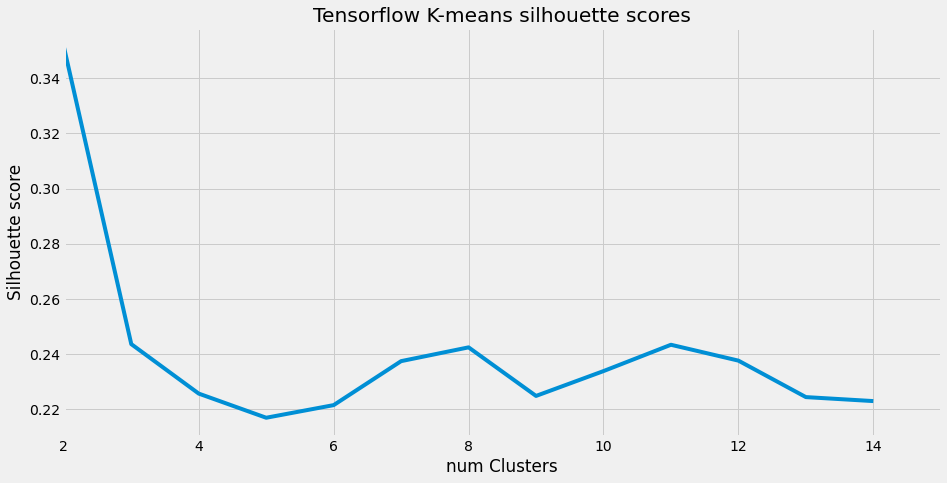

In [58]:

fig, ax = plt.subplots(figsize=(14, 7))
plt.xlim(2, 15)
plt.plot(range(2, 15), scores)
plt.title('Tensorflow K-means silhouette scores')
plt.ylabel('Silhouette score')
plt.xlabel('num Clusters')
plt.show()
    

Now that we have the optimum number of clusters, we can create the final clusters and analyse them

In [35]:
tf_data = pca_data.copy()

num_points = tf_data.shape[0]
dimensions = tf_data.shape[1]
points = np.array(pca_data)
#np.random.uniform(0, 1000, [num_points, dimensions])

def input_fn():
    return tf.compat.v1.train.limit_epochs(tf.convert_to_tensor(points, dtype=tf.float32), num_epochs=1)

num_clusters = 9
kmeans = tf.compat.v1.estimator.experimental.KMeans(
    num_clusters=num_clusters, use_mini_batch=False, seed=42)

# train
num_iterations = 150
previous_centers = None
for _ in range(num_iterations):
    kmeans.train(input_fn)
    cluster_centers = kmeans.cluster_centers()
    if previous_centers is not None:
        print('delta:', cluster_centers - previous_centers)
    previous_centers = cluster_centers
    print('score:', kmeans.score(input_fn))
print('cluster centers:', cluster_centers)

# map the input points to their clusters
cluster_indices = list(kmeans.predict_cluster_index(input_fn))
for i, point in enumerate(points):
    cluster_index = cluster_indices[i]
    center = cluster_centers[cluster_index]
    print('point:', point, 'is in cluster', cluster_index, 'centered at', center)



INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\reesj\\AppData\\Local\\Temp\\tmpub_9qxxs', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_checkpoint_save_graph_def': True, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
Instructions for updating:
Use Variable.read_v

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-5
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 5...
INFO:tensorflow:Saving checkpoints for 5 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 5...
INFO:tensorflow:loss = 770.8631, step = 6
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 7...
INFO:tensorflow:Saving checkpoints for 7 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 7...
INFO:tensorflow:Loss for final step: 770.8631.
delta: [[-0.0084416   0.15950783 -0.1528548  -0.01146775]
 [-0.19706368  0.23370865  0.21485807 -0.11

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-13
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.29098s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:37:07
INFO:tensorflow:Saving dict for global step 13: global_step = 13, loss = 703.37555, score = 703.37555
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-13
score: 703.37555
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-13
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before savin

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:37:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-21
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.22303s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:37:14
INFO:tensorflow:Saving dict for global step 21: global_step = 21, loss = 679.0977, score = 679.0977
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-21
score: 679.0977
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-21
INFO:tensorflow:Running local_init_op.
INFO:t

score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-29
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 29...
INFO:tensorflow:Saving checkpoints for 29 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 29...
INFO:tensorflow:loss = 678.12683, step = 30
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 31...
INFO:tensorflow:Saving checkpoints for 31 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 31...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:37:29
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-39
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.22004s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:37:29
INFO:tensorflow:Saving dict for global step 39: global_step = 39, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-39
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-47
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 47...
INFO:tensorflow:Saving checkpoints for 47 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 47...
INFO:tensorflow:loss = 678.12683, step = 48
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 49...
INFO:tensorflow:Saving checkpoints for 49 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 49...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:37:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-57
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.23860s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:37:44
INFO:tensorflow:Saving dict for global step 57: global_step = 57, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 57: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-57
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-65
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 65...
INFO:tensorflow:Saving checkpoints for 65 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 65...
INFO:tensorflow:loss = 678.12683, step = 65
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 67...
INFO:tensorflow:Saving checkpoints for 67 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 67...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:37:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-75
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.22824s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:37:59
INFO:tensorflow:Saving dict for global step 75: global_step = 75, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 75: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-75
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-83
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 83...
INFO:tensorflow:Saving checkpoints for 83 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 83...
INFO:tensorflow:loss = 678.12683, step = 84
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 85...
INFO:tensorflow:Saving checkpoints for 85 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 85...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:38:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-93
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.21414s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:38:13
INFO:tensorflow:Saving dict for global step 93: global_step = 93, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 93: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-93
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-101
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 101...
INFO:tensorflow:Saving checkpoints for 101 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 101...
INFO:tensorflow:loss = 678.12683, step = 101
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 103...
INFO:tensorflow:Saving checkpoints for 103 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 103...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0.

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:38:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-111
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.21818s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:38:27
INFO:tensorflow:Saving dict for global step 111: global_step = 111, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 111: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-111
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model

score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-119
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 119...
INFO:tensorflow:Saving checkpoints for 119 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 119...
INFO:tensorflow:loss = 678.12683, step = 120
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 121...
INFO:tensorflow:Saving checkpoints for 121 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 121...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0.

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:38:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-129
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.23176s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:38:40
INFO:tensorflow:Saving dict for global step 129: global_step = 129, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 129: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-129
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model

score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-137
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 137...
INFO:tensorflow:Saving checkpoints for 137 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 137...
INFO:tensorflow:loss = 678.12683, step = 137
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 139...
INFO:tensorflow:Saving checkpoints for 139 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 139...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0.

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:38:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-147
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.24476s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:38:54
INFO:tensorflow:Saving dict for global step 147: global_step = 147, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 147: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-147
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model

score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-155
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 155...
INFO:tensorflow:Saving checkpoints for 155 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 155...
INFO:tensorflow:loss = 678.12683, step = 155
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 157...
INFO:tensorflow:Saving checkpoints for 157 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 157...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0.

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:39:08
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-165
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.28420s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:39:08
INFO:tensorflow:Saving dict for global step 165: global_step = 165, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 165: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-165
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model

score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-173
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 173...
INFO:tensorflow:Saving checkpoints for 173 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 173...
INFO:tensorflow:loss = 678.12683, step = 174
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 175...
INFO:tensorflow:Saving checkpoints for 175 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 175...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0.

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:39:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-183
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.25080s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:39:24
INFO:tensorflow:Saving dict for global step 183: global_step = 183, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 183: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-183
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model

score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-191
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 191...
INFO:tensorflow:Saving checkpoints for 191 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 191...
INFO:tensorflow:loss = 678.12683, step = 192
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 193...
INFO:tensorflow:Saving checkpoints for 193 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 193...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0.

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:39:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-201
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.24354s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:39:39
INFO:tensorflow:Saving dict for global step 201: global_step = 201, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 201: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-201
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model

score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-209
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 209...
INFO:tensorflow:Saving checkpoints for 209 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 209...
INFO:tensorflow:loss = 678.12683, step = 209
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 211...
INFO:tensorflow:Saving checkpoints for 211 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 211...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0.

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:39:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-219
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.26972s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:39:53
INFO:tensorflow:Saving dict for global step 219: global_step = 219, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 219: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-219
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model

score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-227
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 227...
INFO:tensorflow:Saving checkpoints for 227 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 227...
INFO:tensorflow:loss = 678.12683, step = 228
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 229...
INFO:tensorflow:Saving checkpoints for 229 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 229...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0.

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:40:08
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-237
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.22702s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:40:09
INFO:tensorflow:Saving dict for global step 237: global_step = 237, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 237: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-237
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model

score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-245
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 245...
INFO:tensorflow:Saving checkpoints for 245 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 245...
INFO:tensorflow:loss = 678.12683, step = 246
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 247...
INFO:tensorflow:Saving checkpoints for 247 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 247...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0.

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:40:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-255
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.23566s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:40:24
INFO:tensorflow:Saving dict for global step 255: global_step = 255, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 255: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-255
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model

score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-263
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 263...
INFO:tensorflow:Saving checkpoints for 263 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 263...
INFO:tensorflow:loss = 678.12683, step = 264
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 265...
INFO:tensorflow:Saving checkpoints for 265 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 265...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0.

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:40:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-273
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.26543s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:40:40
INFO:tensorflow:Saving dict for global step 273: global_step = 273, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 273: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-273
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model

score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-281
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 281...
INFO:tensorflow:Saving checkpoints for 281 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 281...
INFO:tensorflow:loss = 678.12683, step = 282
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 283...
INFO:tensorflow:Saving checkpoints for 283 into C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt.
INFO:tensorflow:Calling checkpoint listeners after saving checkpoint 283...
INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0.

INFO:tensorflow:Loss for final step: 678.12683.
delta: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2022-04-28T21:40:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-291
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Inference Time : 0.23069s
INFO:tensorflow:Finished evaluation at 2022-04-28-21:40:54
INFO:tensorflow:Saving dict for global step 291: global_step = 291, loss = 678.12683, score = 678.12683
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 291: C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-291
score: 678.12683
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model

score: 678.12683
cluster centers: [[ 0.33561403  0.19264172  0.78934675 -0.57702124]
 [-1.7603481   0.7377286   0.2729885  -0.3676516 ]
 [ 0.17596248  1.7780144   1.642575    1.8775204 ]
 [-0.06291018 -0.70204544 -0.46659654 -0.05396919]
 [-1.3670324  -1.211941    0.12712559  0.3683184 ]
 [ 1.4551626  -1.5415863  -0.16312572  0.5440723 ]
 [-0.39708444  1.4470106  -1.3912541   0.14323476]
 [ 2.9072778  -0.5734113   0.48188347 -0.7090173 ]
 [ 4.540513    1.6818362  -0.26515266  0.5329211 ]]
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\reesj\AppData\Local\Temp\tmpub_9qxxs\model.ckpt-299
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
point: [-0.97403464  0.3404281   0.31821244 -0.77179445] is in cluster 1 centered at [-1.7603481  0.7377286  0.2729885 -0.3676516]
point: [-2.68059171 -0.81097233  0.60119527  0.11332504] is in cluster 4 center

point: [ 0.57402604 -1.1285924   0.89440639 -0.47373697] is in cluster 0 centered at [ 0.33561403  0.19264172  0.78934675 -0.57702124]
point: [-0.36363495 -0.88684524  1.75539597 -1.32631975] is in cluster 0 centered at [ 0.33561403  0.19264172  0.78934675 -0.57702124]
point: [ 0.65084074 -0.78865574 -0.55136156 -0.27365246] is in cluster 3 centered at [-0.06291018 -0.70204544 -0.46659654 -0.05396919]
point: [-1.44405032 -0.59731446  0.71504422 -0.55848911] is in cluster 4 centered at [-1.3670324  -1.211941    0.12712559  0.3683184 ]
point: [ 3.68177506  0.63022814 -1.44455939 -0.01231456] is in cluster 8 centered at [ 4.540513    1.6818362  -0.26515266  0.5329211 ]
point: [2.22732582 0.8948088  1.59666673 0.34462868] is in cluster 7 centered at [ 2.9072778  -0.5734113   0.48188347 -0.7090173 ]
point: [-1.32326121 -0.70418852  1.63178347  0.54745847] is in cluster 4 centered at [-1.3670324  -1.211941    0.12712559  0.3683184 ]
point: [ 3.70228415e+00 -4.22165524e-01  2.29588001e-03 -1.

point: [ 0.57170328  1.18831745 -0.81520569  0.32100518] is in cluster 6 centered at [-0.39708444  1.4470106  -1.3912541   0.14323476]
point: [-1.26847088 -1.87934681 -0.09689882  0.59787782] is in cluster 4 centered at [-1.3670324  -1.211941    0.12712559  0.3683184 ]
point: [-1.85646616  1.0043602   0.03170081 -0.09760269] is in cluster 1 centered at [-1.7603481  0.7377286  0.2729885 -0.3676516]
point: [ 1.34906264  0.47524679  0.1058736  -0.83401106] is in cluster 0 centered at [ 0.33561403  0.19264172  0.78934675 -0.57702124]
point: [2.30266374 5.20719044 2.63798598 0.85333962] is in cluster 2 centered at [0.17596248 1.7780144  1.642575   1.8775204 ]
point: [ 0.51954574 -1.31693003 -1.41152753  0.80764171] is in cluster 3 centered at [-0.06291018 -0.70204544 -0.46659654 -0.05396919]
point: [-1.3983364  -0.02792655  0.06738871 -0.76319472] is in cluster 1 centered at [-1.7603481  0.7377286  0.2729885 -0.3676516]
point: [-0.58634081 -0.66575029  0.34124586 -0.42672307] is in cluster 

point: [-0.21249593  1.32925759  1.24754036 -0.10546892] is in cluster 0 centered at [ 0.33561403  0.19264172  0.78934675 -0.57702124]
point: [-1.76637507  0.9730094   0.14059052 -0.31542325] is in cluster 1 centered at [-1.7603481  0.7377286  0.2729885 -0.3676516]
point: [ 1.73311504 -1.23631135  0.24863016 -1.26251914] is in cluster 7 centered at [ 2.9072778  -0.5734113   0.48188347 -0.7090173 ]
point: [-0.14676062 -0.55026742  1.02644239 -0.35851822] is in cluster 0 centered at [ 0.33561403  0.19264172  0.78934675 -0.57702124]
point: [-1.82703903  2.44628143  0.59153987 -0.3982681 ] is in cluster 1 centered at [-1.7603481  0.7377286  0.2729885 -0.3676516]
point: [-0.9902926  -0.30244256  0.39225881 -0.02149447] is in cluster 4 centered at [-1.3670324  -1.211941    0.12712559  0.3683184 ]
point: [-1.4724051   0.88799619  0.82033691 -1.00192987] is in cluster 1 centered at [-1.7603481  0.7377286  0.2729885 -0.3676516]
point: [ 0.57079868 -0.04248018  0.45570574  2.11266826] is in clus

In [36]:
Counter(cluster_indices)

Counter({1: 68, 4: 52, 3: 52, 7: 28, 6: 38, 0: 37, 5: 28, 2: 11, 8: 16})

In [37]:
tf_cluster_df = pca_data.copy()
tf_cluster_df['tf_cluster'] = cluster_indices
tf_cluster_df['la_name'] = la_names
tf_cluster_df

,principal component 1,principal component 2,principal component 3,principal component 4,tf_cluster,la_name
0,-0.974035,0.340428,0.318212,-0.771794,1,Adur
1,-2.680592,-0.810972,0.601195,0.113325,4,Allerdale
2,-1.463782,0.300473,-0.873444,-0.156912,1,Amber Valley
3,-2.080615,1.178056,0.240204,0.055507,1,Arun
4,-0.371475,-0.706034,0.119654,-0.277553,3,Ashfield
...,...,...,...,...,...,...
325,-1.257668,-2.009889,0.508029,0.344201,4,Worthing
326,-1.183083,1.484017,-1.245079,-0.317417,6,Wrexham
327,-2.222119,0.875410,0.184766,-0.371733,1,Wychavon
328,-1.748331,-0.638329,0.220288,-0.249796,4,Wyre


In [38]:
Counter(cluster_indices)

Counter({1: 68, 4: 52, 3: 52, 7: 28, 6: 38, 0: 37, 5: 28, 2: 11, 8: 16})

Plotting the 3d scatter plot to visualise clusters

In [39]:

fig = px.scatter_3d(tf_cluster_df,
                    x='principal component 1',
                    y='principal component 2',
                    z='principal component 3',
              color='tf_cluster')
fig.show()

In [40]:
# check the silhouette score
sklearn.metrics.silhouette_score(pca_data.copy(), cluster_indices)

0.2248516581619281

In [55]:
fig.write_html(r'C:\Users\reesj\Downloads\Cluster_analysis\Cluster_analysis\Outputs\Cluster_Groupings\tensorflow_clusters9.html')

In [548]:
tf_cluster_df.to_csv(r'C:\Users\reesj\Downloads\Cluster_analysis\Cluster_analysis\Outputs\Cluster_Groupings\tensorflow_clusters.csv')

# testing k-means with 6 clusters instead of 10

As none of the previous methods have worked particularly well, I thought I'd give 6 clusters a go with the un standardised data, hoping that this contains more signal, and that maybe we cut out too much information during the PCA process

In [41]:
df_age = df_age.drop(['LA code21', 'LA name21'], axis=1)

For n_clusters = 2 The average silhouette_score is : 0.4530348083957599
For n_clusters = 3 The average silhouette_score is : 0.42347348949436037
For n_clusters = 4 The average silhouette_score is : 0.3521724902879543
For n_clusters = 5 The average silhouette_score is : 0.3076919871122414
For n_clusters = 6 The average silhouette_score is : 0.2710223311789163
For n_clusters = 7 The average silhouette_score is : 0.29634088958224813
For n_clusters = 8 The average silhouette_score is : 0.2719447915122338
For n_clusters = 9 The average silhouette_score is : 0.2817033083201716
For n_clusters = 10 The average silhouette_score is : 0.26591450139947465
For n_clusters = 11 The average silhouette_score is : 0.29257373951853555
For n_clusters = 12 The average silhouette_score is : 0.28594834701109567
For n_clusters = 13 The average silhouette_score is : 0.2707724291869795
For n_clusters = 14 The average silhouette_score is : 0.27240005438268966


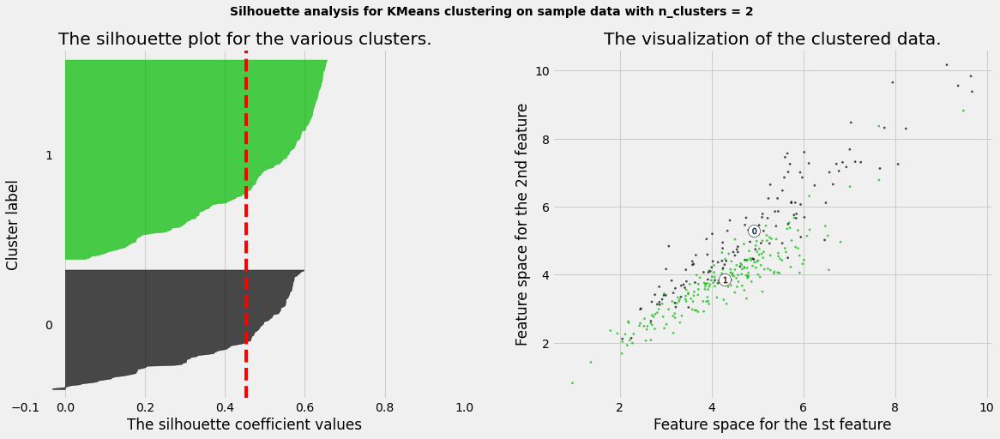

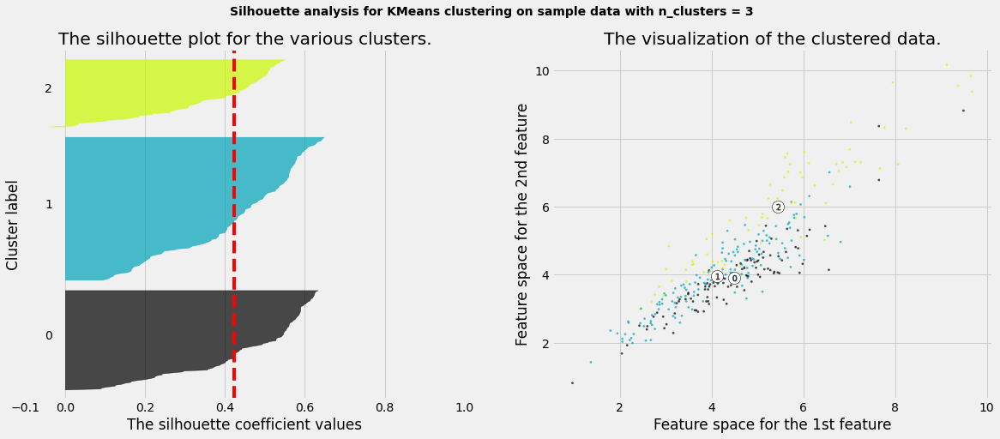

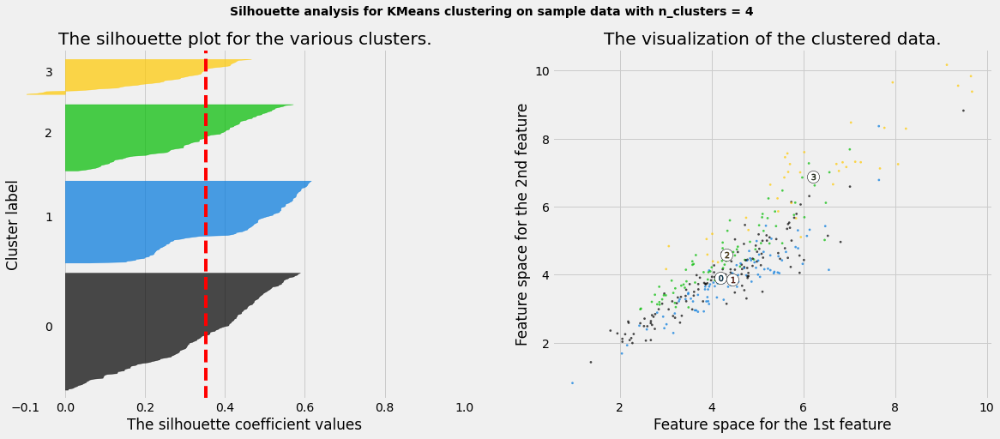

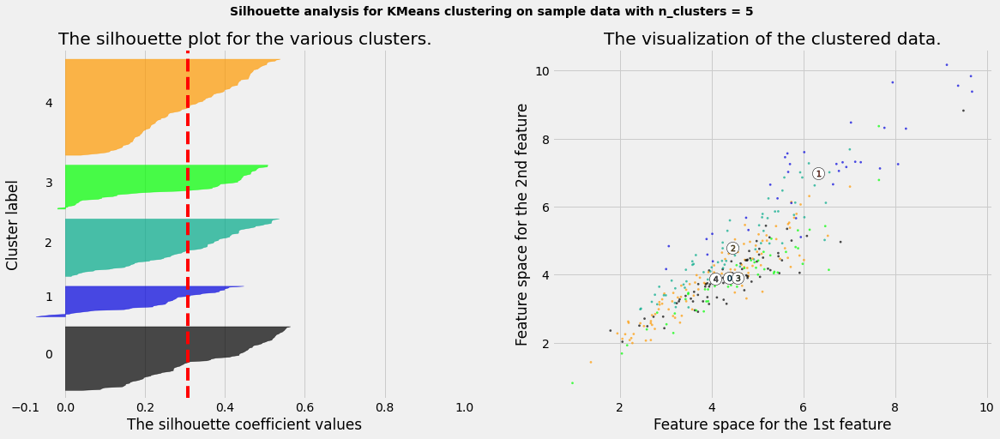

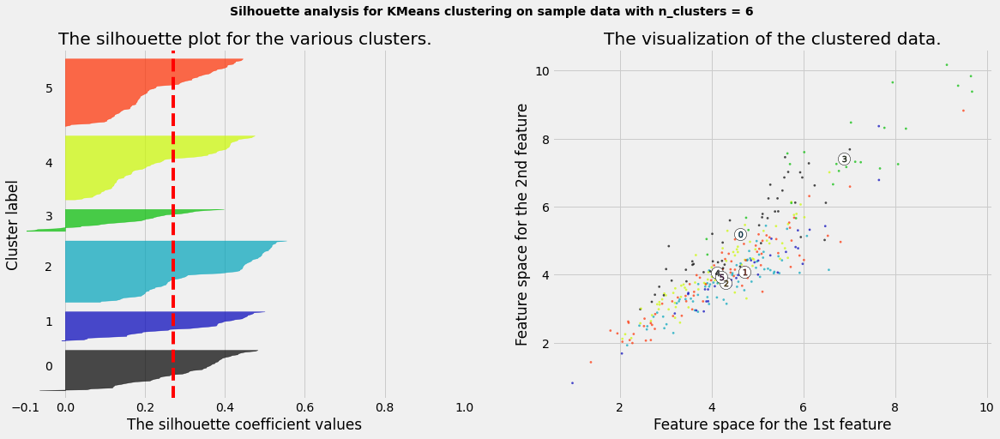

...

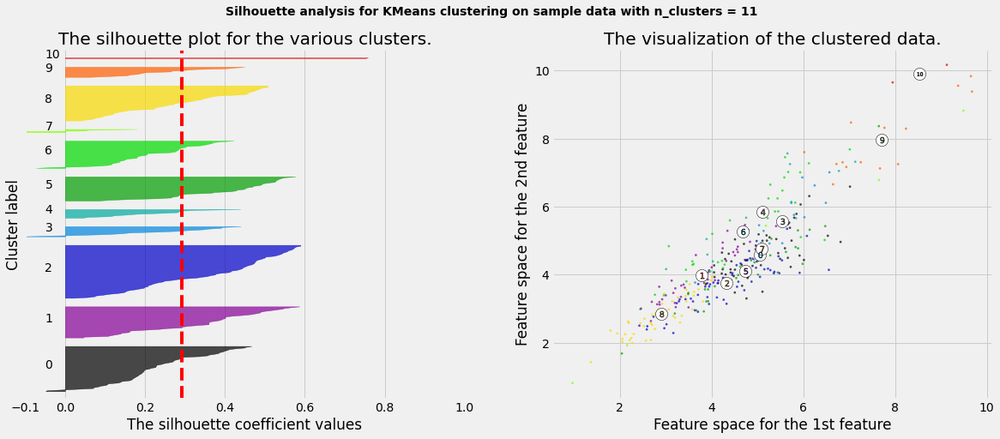

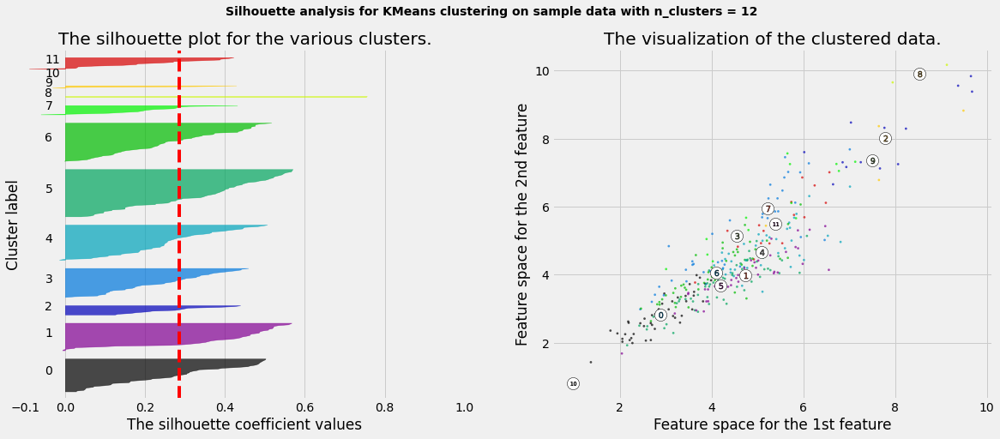

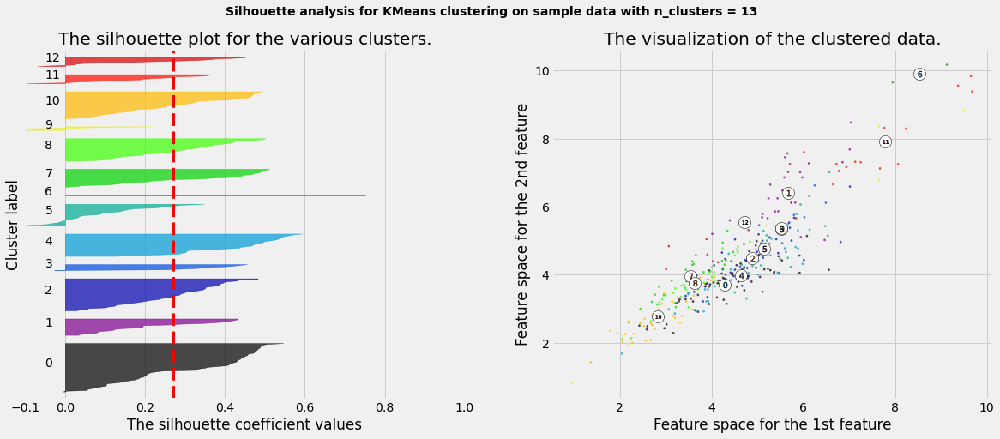

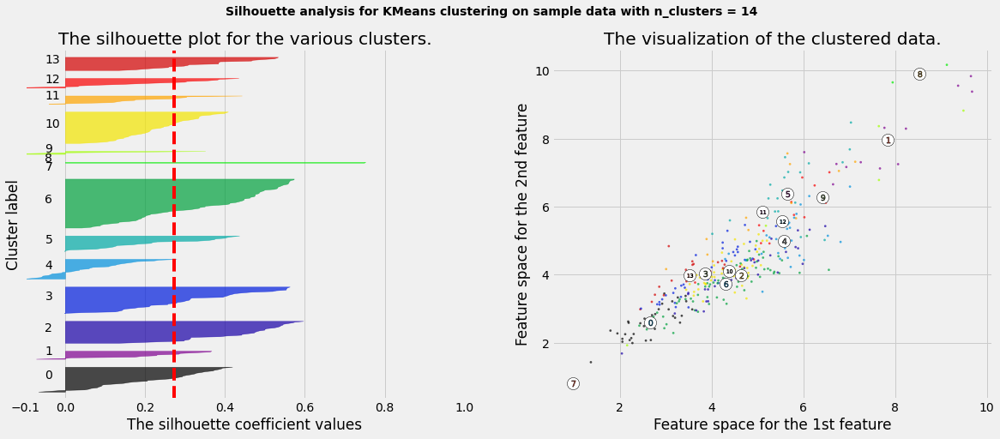

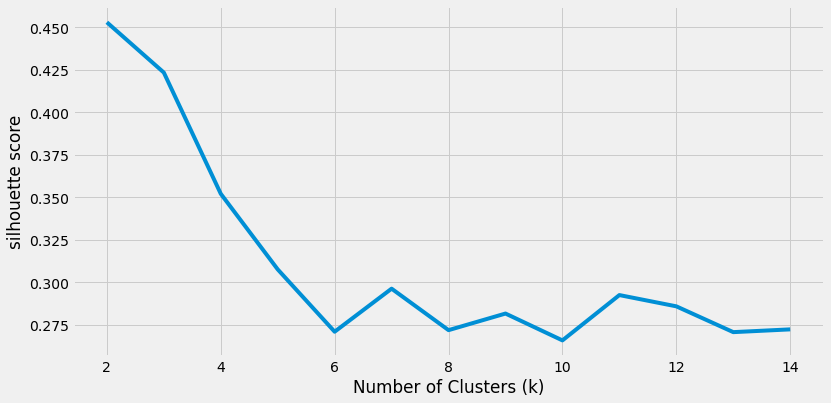

In [42]:




# here we select our zscore normalised data
X = pd.DataFrame(df_age)

range_n_clusters = range(2,15)
silhouette_avg_n_clusters = []

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    silhouette_avg_n_clusters.append(silhouette_avg)
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

     # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X.iloc[:, 0], X.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                 c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                   s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()


style.use("fivethirtyeight")
plt.plot(range_n_clusters, silhouette_avg_n_clusters)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("silhouette score")
plt.show()

In [43]:
kmeans = KMeans(n_clusters=6)

In [44]:
cluster_labels = kmeans.fit_predict(df_age)


In [45]:
kmeans_cluster_df = df_age.copy()

kmeans_cluster_df['LA'] = la_names
kmeans_cluster_df['cluster'] = cluster_labels

kmeans_cluster_df

,PDS_inchurn_pc,PDS_outchurn_pc,PDS_netchurn_pc,CE_perc,ABPEv3_netchurn_pc,mean_age,median_age,LA,cluster
0,4.780641,4.436945,0.343696,1.2,0.252931,43.475187,45.0,Adur,4
1,2.587944,2.386432,0.201512,1.5,-0.154710,44.729319,48.0,Allerdale,4
2,4.115586,3.326648,0.788938,0.9,0.872958,43.380625,46.0,Amber Valley,4
3,4.423419,3.686908,0.736511,2.5,0.484574,46.305739,49.0,Arun,0
4,4.008036,3.933770,0.074266,1.1,0.368830,41.067098,41.0,Ashfield,3
...,...,...,...,...,...,...,...,...,...
326,2.192605,2.580963,-0.388358,1.2,0.089787,41.407769,42.0,Wrexham,3
327,5.149382,4.155045,0.994337,1.2,1.453343,44.765508,48.0,Wychavon,4
328,4.359850,3.641684,0.718166,1.7,0.288346,46.129279,49.0,Wyre,0
329,3.287558,3.212526,0.075031,1.0,0.282398,44.068288,46.0,Wyre Forest,4


In [46]:
kmeans_cluster_df['cluster'].value_counts()

3    113
4     71
2     68
1     42
0     34
5      2
Name: cluster, dtype: int64

In [47]:
sklearn.metrics.silhouette_score(df_age, cluster_labels)

0.31777544647948336

Plotting the 3d scatter plot to visualise clusters

In [48]:

fig = px.scatter_3d(kmeans_cluster_df,
                    x='mean_age',
                    y='ABPEv3_netchurn_pc',
                    z='PDS_netchurn_pc',
              color='cluster')
fig.show()


In [76]:
kmeans_cluster_df.to_csv(r'C:\Users\reesj\Downloads\Cluster_analysis\Cluster_analysis\Outputs\Cluster_Groupings\kmeans_6_final.csv')

In [71]:
fig.write_html(r'C:\Users\reesj\Downloads\Cluster_analysis\Cluster_analysis\Outputs\Cluster_Groupings\hierarchical_clusters_6_final.html')